In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [3]:
import sys
from os.path import join
#sys.path.insert(0,'/Users/megret/Documents/Research/BeeTracking/Soft/labelbeeconvert')
#sys.path.insert(0,'/Users/megret/Documents/Research/BeeTracking/Soft/apriltag/swatbotics-apriltag/python/')
sys.path.insert(0,'/mnt/storage/work/rmegret/labelbeeconvert')
from labelbeeconvert import labelbee_convert as lb
import re

/mnt/storage/work/rmegret/labelbeeconvert/labelbeeconvert/labelbee_convert.py:277: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [50]:
from beevideoutil import video as bv

In [4]:
from tqdm.notebook import tqdm
# Test
for i in tqdm(range(50)):
    pass

## Load EVENT files

In [ ]:
ivanroot='/mnt/storage/work/irodriguez/detections/one_week'
%ls -lh {ivanroot}/*
#%ls -lh {ivanroot}/EVENT_*

In [ ]:
T0=lb.load_tracks_json(join(ivanroot,'EVENT_Complete_v2_ID_nms_Track_merged_C02_170621110000_fine_new.json'))

In [ ]:
T0=lb.load_tracks_json(join(ivanroot,'EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621110000_fine_new.json'))

In [172]:
%ls -lht /mnt/storage/work/irodriguez/detections/one_week/*nms*merged_C02_170621080000_fine_new*

-rw-rw-r-- 1 irodriguez irodriguez 355M Mar 29 23:47 /mnt/storage/work/irodriguez/detections/one_week/EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621080000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez  19M Apr 26  2019 /mnt/storage/work/irodriguez/detections/one_week/TRK_Pollen_Raw_nms_idx_merged_C02_170621080000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez  265 Apr 26  2019 /mnt/storage/work/irodriguez/detections/one_week/Count_v2_ID_nms_Track_merged_C02_170621080000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 355M Apr 26  2019 /mnt/storage/work/irodriguez/detections/one_week/EVENT_Complete_v2_ID_nms_Track_merged_C02_170621080000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez  28M Apr 25  2019 /mnt/storage/work/irodriguez/detections/one_week/Track_nms_merged_C02_170621080000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez  45M Apr 25  2019 /mnt/storage/work/irodriguez/detections/one_week/ID_nms_Track_merged_C02_170621080000_fine_new.json
-rw-rw-r-- 1 irodriguez

In [ ]:
T0=lb.load_tracks_json('/mnt/storage/work/irodriguez/detections/one_week/TRK_merged_C02_170621080000_fine_new.json' )

In [56]:
T1=lb.load_tracks_json('/mnt/storage/work/irodriguez/detections/one_week/TRK_Pollen_Raw_merged_C02_170621120000_fine_new.json' )

In [248]:
out = lb.extract_events_from_files(['/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json' ])
df = pd.DataFrame(out)

/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json 2017-06-21 12:00:00
  Load
  Extract


In [64]:
jdf.columns

Index(['videoid', 'trackid', 'frame', 'datetime', 'cx', 'cy', 'entering',
       'leaving', 'walking', 'pollen', 'tagid', 'taghamming', 'tx', 'ty',
       'tagdm', 'track_class', 'track_length', 'track_startx', 'track_starty',
       'track_starta', 'track_endx', 'track_endy', 'track_enda'],
      dtype='object')

In [249]:
jdf=df[df.frame<10000].copy()
#jdf.track_length=np.minimum(jdf.endframe,50)-jdf.startframe

jdf = lb.augment_df(jdf)
jdf.track_length=np.minimum(jdf.track_endframe,10000)-jdf.track_startframe

### LOAD

In [5]:
# Detections
D=lb.load_tracks_json('/mnt/storage/work/irodriguez/detections/one_week/merged_C02_170621080000_fine_new.json')

In [ ]:
D['0']['parts']

In [23]:
for i,P in enumerate(dict(a=3,b=5,z=6,d=2)):
    print(i,P)

0 a
1 b
2 z
3 d


### TRACK

In [10]:
frames=sorted([int(k) for k in D.keys()])
maxframe=frames[-1]
maxframe

71999

In [6]:
DD={str(k):D[str(k)] for k in range(20000)}

In [108]:
#%%timeit -r 1 -n 1
df=lb.detections_ivan_to_df(D, debug=False)
print(df.shape)
detdf=df[df.partid==2]
print(detdf.shape)


(4060266, 6)
(907204, 6)


<AxesSubplot:>

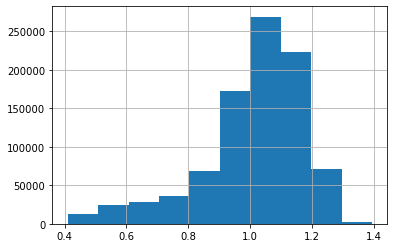

In [114]:
detdf.score.hist()

In [86]:
%load_ext line_profiler

In [112]:
%%timeit -r 1 -n 1
dets = detdf[['cx','cy','score','detid','frame']].groupby('frame').apply(lambda df: df.to_numpy())

4.86 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [109]:
T=lb.hungarian_tracking_with_prediction_df(detdf, 150, nms_min_dist=50, max_step=3, debug=False, progress=False)

2min 42s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [ ]:
%lprun?

In [ ]:
%lprun -f lb.hungarian_tracking_with_prediction lb.hungarian_tracking_with_prediction(DD, 150, part='2', nms_min_dist=50, max_step=3, debug=False, progress=False)

In [ ]:
%lprun -f lb.hungarian_tracking_with_prediction_new lb.hungarian_tracking_with_prediction_new(DD, 150, part='2', nms_min_dist=50, max_step=3, debug=False, progress=False)

In [34]:
#%%timeit -r 1 -n 1
T1=lb.hungarian_tracking_with_prediction(DD, 150, part='2', nms_min_dist=50, max_step=3, debug=False, progress=False)

In [25]:
A=np.random.normal(size=(3,4))
A[:,(0,1,)]

array([[-0.39044518,  0.0249594 ],
       [-0.73103181, -0.7908595 ],
       [-0.47105375,  0.87098562]])

In [33]:
#%%timeit -r 1 -n 1
T2=lb.hungarian_tracking_with_prediction_new(DD, 150, part='2', nms_min_dist=50, max_step=3, debug=False, progress=False)

In [35]:
ddf1=lb.trackraw_to_df(T1, videoid=3)
ddf2=lb.trackraw_to_df(T2, videoid=3)

In [71]:
display(ddf1)
display(ddf2)

,videoid,trackid,frame,cx,cy,detid,score,entering,leaving,walking,...,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,virtual,vx,vy,predictx,predicty
0,3,0,0,472.0,0.0,0,0.475505,False,False,False,...,False,False,NaN,0,18,False,0.0,0.0,0.0,0.0
1,3,0,1,472.0,0.0,-1,-1.000000,False,False,False,...,False,False,NaN,0,18,True,0.0,0.0,472.0,0.0
2,3,0,2,444.0,0.0,0,0.446176,False,False,False,...,False,False,NaN,0,18,False,-14.0,0.0,472.0,0.0
3,3,0,3,440.0,0.0,0,0.747036,False,False,False,...,False,False,NaN,0,18,False,-2.0,0.0,430.0,0.0
4,3,0,4,456.0,48.0,0,0.740280,False,False,False,...,False,False,NaN,0,18,False,8.0,24.0,438.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10960,3,212,995,2108.0,156.0,0,1.111101,False,False,False,...,False,False,NaN,991,999,False,-8.0,2.0,2136.0,162.0
10961,3,212,996,2120.0,176.0,1,0.923018,False,False,False,...,False,False,NaN,991,999,False,6.0,10.0,2100.0,158.0
10962,3,212,997,2144.0,184.0,0,1.061078,False,False,False,...,False,False,NaN,991,999,False,12.0,4.0,2126.0,186.0
10963,3,212,998,2144.0,184.0,0,1.068350,False,False,False,...,False,False,NaN,991,999,False,0.0,0.0,2156.0,188.0


,videoid,trackid,frame,cx,cy,detid,score,entering,leaving,walking,...,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,virtual,vx,vy,predictx,predicty
0,3,0,0,472.0,0.0,0.0,0.475505,False,False,False,...,False,False,NaN,0,18,False,0.0,0.0,0.0,0.0
1,3,0,1,472.0,0.0,-1.0,-1.000000,False,False,False,...,False,False,NaN,0,18,True,0.0,0.0,472.0,0.0
2,3,0,2,444.0,0.0,0.0,0.446176,False,False,False,...,False,False,NaN,0,18,False,-14.0,0.0,472.0,0.0
3,3,0,3,440.0,0.0,0.0,0.747036,False,False,False,...,False,False,NaN,0,18,False,-2.0,0.0,430.0,0.0
4,3,0,4,456.0,48.0,0.0,0.740280,False,False,False,...,False,False,NaN,0,18,False,8.0,24.0,438.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10960,3,212,995,2108.0,156.0,0.0,1.111101,False,False,False,...,False,False,NaN,991,999,False,-8.0,2.0,2136.0,162.0
10961,3,212,996,2120.0,176.0,1.0,0.923018,False,False,False,...,False,False,NaN,991,999,False,6.0,10.0,2100.0,158.0
10962,3,212,997,2144.0,184.0,0.0,1.061078,False,False,False,...,False,False,NaN,991,999,False,12.0,4.0,2126.0,186.0
10963,3,212,998,2144.0,184.0,0.0,1.068350,False,False,False,...,False,False,NaN,991,999,False,0.0,0.0,2156.0,188.0


In [38]:
ddf= ddf2

In [36]:
ids=np.flatnonzero((ddf1.head(10000)!=ddf2.head(10000))[['trackid','frame','detid']].any(axis=1).values)

In [37]:
ids

array([], dtype=int64)

In [68]:
Q='trackid==13 and frame>=58'
display(ddf1.query(Q))
display(ddf2.query(Q))

,videoid,trackid,frame,cx,cy,detid,score,entering,leaving,walking,...,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,virtual,vx,vy,predictx,predicty
3610,3,13,58,2036.0,1044.0,10,0.982359,False,False,False,...,False,False,<NA>,0,60,False,-6.0,2.0,2046.0,1046.0
3611,3,13,59,2020.0,1028.0,10,1.118539,False,False,False,...,False,False,<NA>,0,60,False,-8.0,-8.0,2030.0,1046.0
3612,3,13,60,2020.0,1052.0,9,0.987538,False,False,False,...,False,False,<NA>,0,60,False,0.0,12.0,2012.0,1020.0


,videoid,trackid,frame,cx,cy,detid,score,entering,leaving,walking,...,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,virtual,vx,vy,predictx,predicty
3610,3,13,58,2036.0,1044.0,10.0,0.982359,False,False,False,...,False,False,<NA>,0,75,False,-6.0,2.0,2046.0,1046.0
3611,3,13,59,2020.0,1028.0,10.0,1.118539,False,False,False,...,False,False,<NA>,0,75,False,-8.0,-8.0,2030.0,1046.0
3612,3,13,60,2020.0,1052.0,9.0,0.987538,False,False,False,...,False,False,<NA>,0,75,False,0.0,12.0,2012.0,1020.0
3613,3,13,61,2020.0,1064.0,-1.0,-1.000000,False,False,False,...,False,False,<NA>,0,75,True,0.0,12.0,2020.0,1064.0
3614,3,13,62,2020.0,1076.0,-1.0,-1.000000,False,False,False,...,False,False,<NA>,0,75,True,0.0,12.0,2020.0,1076.0
3615,3,13,63,2020.0,1088.0,-1.0,-1.000000,False,False,False,...,False,False,<NA>,0,75,True,0.0,12.0,2020.0,1088.0
3616,3,13,64,2040.0,1076.0,11.0,0.816261,False,False,False,...,False,False,<NA>,0,75,False,10.0,-6.0,2020.0,1100.0
3617,3,13,65,2008.0,1084.0,11.0,0.958005,False,False,False,...,False,False,<NA>,0,75,False,-16.0,4.0,2050.0,1070.0
3618,3,13,66,2012.0,1088.0,10.0,1.111698,False,False,False,...,False,False,<NA>,0,75,False,2.0,2.0,1992.0,1088.0
3619,3,13,67,1984.0,1088.0,10.0,1.077459,False,False,False,...,False,False,<NA>,0,75,False,-14.0,0.0,2014.0,1090.0


In [64]:
ddf1.iloc[ids]

,videoid,trackid,frame,cx,cy,detid,score,entering,leaving,walking,...,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,virtual,vx,vy,predictx,predicty
3613,3,14,1,744.0,1116.0,13,0.725757,False,False,False,...,False,False,NaN,1,13,False,0.0,0.0,0.0,0.0
3614,3,14,2,740.0,1108.0,14,1.017004,False,False,False,...,False,False,NaN,1,13,False,-2.0,-4.0,744.0,1116.0
3615,3,14,3,712.0,1100.0,14,0.985494,False,False,False,...,False,False,NaN,1,13,False,-14.0,-4.0,738.0,1104.0
3616,3,14,4,708.0,1104.0,16,0.957610,False,False,False,...,False,False,NaN,1,13,False,-2.0,2.0,698.0,1096.0
3617,3,14,5,692.0,1104.0,14,0.980794,False,False,False,...,False,False,NaN,1,13,False,-8.0,0.0,706.0,1106.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,3,173,815,800.0,956.0,11,0.910453,False,False,False,...,False,False,NaN,814,822,False,0.0,-4.0,800.0,964.0
9996,3,173,816,796.0,952.0,10,0.735445,False,False,False,...,False,False,NaN,814,822,False,-2.0,-2.0,800.0,952.0
9997,3,173,817,788.0,1000.0,10,0.579169,False,False,False,...,False,False,NaN,814,822,False,-4.0,24.0,794.0,950.0
9998,3,173,818,784.0,1024.0,-1,-1.000000,False,False,False,...,False,False,NaN,814,822,True,-4.0,24.0,784.0,1024.0


In [65]:
ddf2.iloc[ids]

,videoid,trackid,frame,cx,cy,detid,score,entering,leaving,walking,...,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,virtual,vx,vy,predictx,predicty
3613,3,13,61,2020.0,1064.0,-1.0,-1.000000,False,False,False,...,False,False,NaN,0,75,True,0.0,12.0,2020.0,1064.0
3614,3,13,62,2020.0,1076.0,-1.0,-1.000000,False,False,False,...,False,False,NaN,0,75,True,0.0,12.0,2020.0,1076.0
3615,3,13,63,2020.0,1088.0,-1.0,-1.000000,False,False,False,...,False,False,NaN,0,75,True,0.0,12.0,2020.0,1088.0
3616,3,13,64,2040.0,1076.0,11.0,0.816261,False,False,False,...,False,False,NaN,0,75,False,10.0,-6.0,2020.0,1100.0
3617,3,13,65,2008.0,1084.0,11.0,0.958005,False,False,False,...,False,False,NaN,0,75,False,-16.0,4.0,2050.0,1070.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,3,159,809,924.0,444.0,3.0,1.240916,False,False,False,...,False,False,NaN,804,862,False,-4.0,52.0,920.0,382.0
9996,3,159,810,940.0,452.0,3.0,1.018480,False,False,False,...,False,False,NaN,804,862,False,8.0,4.0,920.0,496.0
9997,3,159,811,956.0,476.0,3.0,1.199633,False,False,False,...,False,False,NaN,804,862,False,8.0,12.0,948.0,456.0
9998,3,159,812,960.0,480.0,3.0,1.225900,False,False,False,...,False,False,NaN,804,862,False,2.0,2.0,964.0,488.0


In [115]:
ddf=lb.trackraw_to_df(T, videoid=3)
ddf=ddf.sort_values(['frame','trackid'])
ddf=ddf.reset_index(drop=True)
ddf.shape

(1346, 29)

In [129]:
dff0 = ddf.groupby('trackid').get_group(3)[['frame','cx','cy','virtual']]

In [131]:
dff0.iloc[0]

frame          0
cx         604.0
cy         192.0
virtual    False
Name: 3, dtype: object

In [58]:
ddf2=lb.trackraw_to_df(T2, videoid=3)
ddf2=ddf2.sort_values(['frame','trackid'])
ddf2=ddf2.reset_index(drop=True)
ddf2.shape

(1346, 29)

In [60]:
(ddf==ddf2).all()

videoid              True
trackid              True
frame                True
cx                   True
cy                   True
detid                True
score                True
entering             True
leaving              True
walking              True
pollen               True
tagid               False
taghamming          False
tx                  False
ty                  False
tagdm               False
track_class         False
track_length         True
hastag               True
track_haspollen      True
track_hastag         True
track_tagid         False
track_startframe     True
track_endframe       True
virtual              True
vx                   True
vy                   True
predictx             True
predicty             True
dtype: bool

In [62]:
ddf.tagid

0       <NA>
1       <NA>
2       <NA>
3       <NA>
4       <NA>
        ... 
1341    <NA>
1342    <NA>
1343    <NA>
1344    <NA>
1345    <NA>
Name: tagid, Length: 1346, dtype: object

In [267]:
ddf.trackid.unique().size

1181

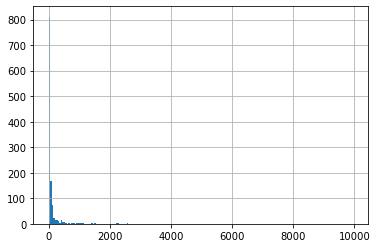

In [264]:
v=ddf.groupby('trackid').first().track_length.hist(bins=np.arange(0,10000,50))

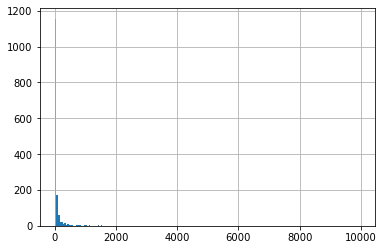

In [265]:
v2=jdf.groupby('trackid').first().track_length.hist(bins=np.arange(0,10000,50))

### Long tracks

In [231]:
ldf=ddf[(ddf.track_length<=2000)&(ddf.track_length>1000)]
lids=ldf.trackid.unique()
lids

array([  37,  142,  245,  384,  432,  468,  663,  671,  688,  770,  958,
       1006, 1008, 1066, 1076, 1099, 1123])

In [166]:
Tdf.shape

(2270, 29)

N=1135


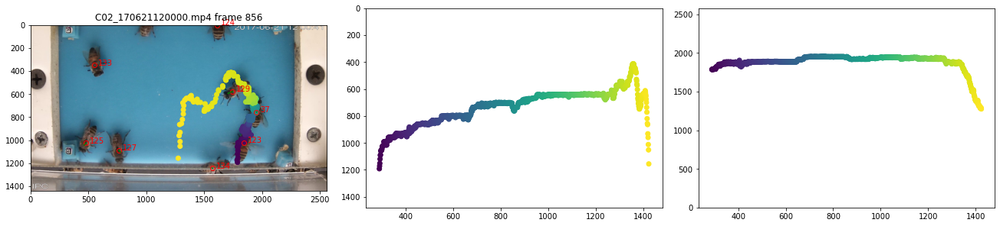

In [279]:
bv.plottrack(ddf, videos, 37)

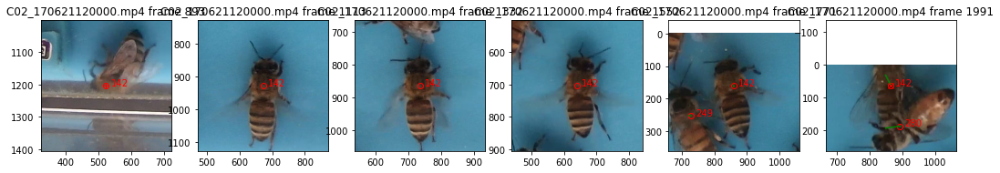

In [247]:
ny,nx=1,6
fig,ax=plt.subplots(ny,nx, figsize=(nx*3,ny*3))
ax=ax.ravel()

Tdfs = Tdf.iloc[np.round(np.linspace(0,Tdf.shape[0]-1,nx*ny))]
for i,(k,item) in enumerate(Tdfs.iterrows()):
    #print(item.frame)
    plt.sca(ax[i])
    #plt.plot(0,0)
    bv.plot1Frame(ddf,videos, 3,item.frame, debug=False, 
                  focus=True, focus_center=(item.cx,item.cy));

### Virtual obs

In [43]:
def classif_event(track):
    inside=300
    outside=800
    
    sy = track.iloc[0].cy
    ey = track.iloc[-1].cy
    if ((sy<inside)&(ey<inside)):
        return 'noise'
    if ((sy>outside)&(ey>outside)):
        return 'noise'
    if ((sy<inside)&(ey>outside)):
        return 'exit'
    if ((sy>outside)&(ey<inside)):
        return 'entrance'
    if ((sy<outside)&(ey>outside)):
        return 'exit_partial'
    if ((sy>outside)&(ey<outside)):
        return 'entrance_partial'
    return 'walking'
cdf=ddf.groupby(['videoid','trackid']).apply(classif_event)

In [39]:
tgdf=ddf.groupby(['videoid','trackid'])
tdf=tgdf[ [c for c in ddf.columns if c.startswith('track')] ].first()

In [40]:
tdf.track_class.unique()

array([None], dtype=object)

In [41]:
tdf['vcount']=tgdf.virtual.sum()
tdf['vratio']=tgdf.virtual.mean()

In [44]:
tdf['track_class']=tgdf.apply(classif_event)
tdf.track_class.value_counts()

noise               3188
exit                1039
entrance             949
walking              249
exit_partial          93
entrance_partial      33
Name: track_class, dtype: int64

In [45]:
class Noise:
    def __init__(self,sigma):
        self.sigma=sigma
    def __add__(self, A):
        return A+np.random.normal(0.0, self.sigma, size=A.shape)

Text(0.5, 1.0, 'vcount = f(length)')

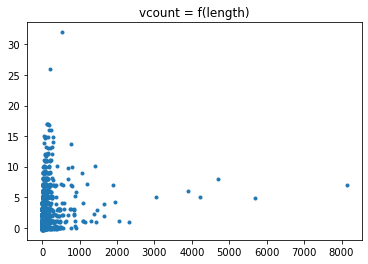

In [46]:
plt.plot(tdf.track_length, Noise(0.1)+tdf.vcount,'.')
plt.title('vcount = f(length)')

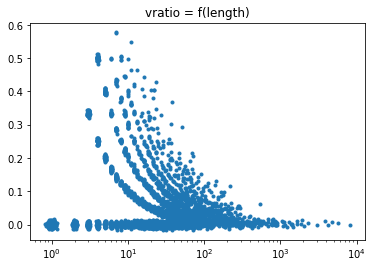

In [47]:
plt.plot(Noise(0.05)+tdf.track_length, Noise(0.005)+tdf.vratio,'.')
plt.title('vratio = f(length)')
plt.xscale('log')

In [48]:
tdf[(tdf.vratio>0.2)&(tdf.track_class=='walking')]

trackid track_class  track_length  track_haspollen  \
videoid trackid                                                       
3       2075        2075     walking             8            False   
        2150        2150     walking             6            False   
        2194        2194     walking            37            False   
        2310        2310     walking             5            False   
        2405        2405     walking            10            False   
        2463        2463     walking            14            False   
        2727        2727     walking             4            False   
        4307        4307     walking            11            False   
        5162        5162     walking             4            False   
        5213        5213     walking             3            False   

                 track_hastag track_tagid  track_startframe  track_endframe  \
videoid trackid                                                               
3       2075            False        None              8419            8426   
        2150            False        None              8660            8665   
        2194            False        None              8774            8810   
        2310            False        None              9085            9089   
        2405            False        None              9401            9410   
        2463            False        None              9630            9643   
        2727            False        None             10646           10649   
        4307            False        None             15778           15788   
        5162            False        None             18605           18608   
        5213            False        None             18727           18729   

                 vcount    vratio  
videoid trackid                    
3       2075          2  0.250000  
        2150          2  0.333333  
        2194          8  0.216216  
        2310          2  0.400000  
        2405          3  0.300000  
        2463          3  0.214286  
        2727          2  0.500000  
        4307          4  0.363636  
        5162          2  0.500000  
        5213          1  0.333333

In [49]:
trackid = tdf[(tdf.vratio>0.2)&(tdf.track_class=='walking')].trackid.iloc[1]
bv.plottrack(ddf, videos, trackid)

NameError: name 'bv' is not defined

### Interrupted tracks

In [334]:
intdf=ddf[(ddf.track_endframe==ddf.frame)&(ddf.cy>200)&(ddf.cy<1000)&(ddf.frame<10000)]
print(intdf.shape)
appdf=ddf[(ddf.track_startframe==ddf.frame)&(ddf.cy>200)&(ddf.cy<1000)&(ddf.frame>0)]
print(appdf.shape)

(61, 29)
(59, 29)


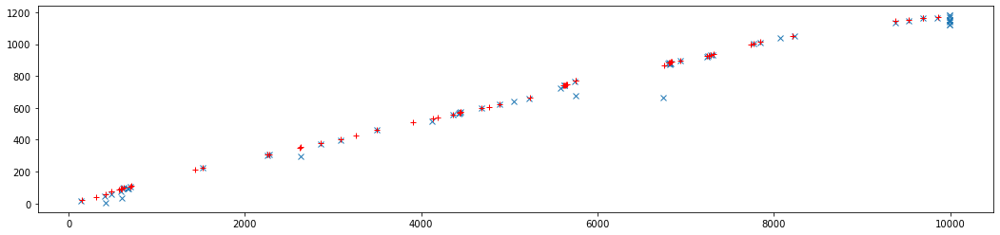

In [337]:
fig=plt.figure(figsize=(18,4))
plt.plot(intdf.frame,intdf.trackid,'x')
plt.plot(appdf.frame,appdf.trackid,'r+')

In [353]:
def dist(itemi, itema):
    x1,y1=itemi[['cx','cy']]
    x2,y2=itema[['cx','cy']]
    return np.sqrt((x1-x2)**2+(y1-y2)**2)
NI,NA=intdf.shape[0],appdf.shape[0]
M = np.zeros((NI,NA))
possible_pairs=[]
for i in range(NI):
    itemi = intdf.iloc[i]
    for a in range(NA):
        itema = appdf.iloc[a]
        if ( (itemi.track_endframe<itema.track_startframe+2) 
             and (itemi.track_endframe>itema.track_startframe-10) ):
            if ( dist(itemi, itema)<200):
                #M[i,a]=1
                deltaframe = itema.track_startframe-itemi.track_endframe
                possible_pairs.append((itemi.trackid,itema.trackid, deltaframe, dist(itemi, itema)))
#plt.imshow(M)
possible_pairs

[(15, 22, 4, 17.88854381999832),
 (59, 73, 4, 22.627416997969522),
 (74, 92, 3, 112.71202242884297),
 (36, 94, 5, 72.44308110509934),
 (95, 95, -1, 8.94427190999916),
 (98, 98, 0, 0.0),
 (105, 108, 5, 108.664621657649),
 (105, 109, 9, 76.10519036176179),
 (225, 225, 0, 0.0),
 (303, 308, 1, 161.9876538505327),
 (396, 402, 4, 16.0),
 (462, 462, 0, 0.0),
 (516, 536, 6, 22.627416997969522),
 (566, 568, 5, 16.0),
 (568, 568, -1, 5.656854249492381),
 (568, 569, 4, 72.11102550927978),
 (569, 573, 4, 133.2066064427737),
 (569, 574, 4, 72.11102550927978),
 (574, 573, 0, 62.48199740725323),
 (574, 574, 0, 0.0),
 (599, 599, 0, 0.0),
 (625, 625, 0, 0.0),
 (660, 666, 6, 72.11102550927978),
 (741, 743, 6, 20.396078054371138),
 (743, 744, 7, 12.649110640673518),
 (765, 769, 4, 43.08131845707603),
 (675, 770, 4, 43.266615305567875),
 (899, 899, 0, 0.0),
 (917, 924, 5, 34.17601498127012),
 (932, 932, 0, 0.0),
 (934, 936, 2, 166.4692163734785),
 (1002, 1003, 1, 184.1738309315414),
 (1010, 1017, 1, 165.6

36 94
N=315
N=63


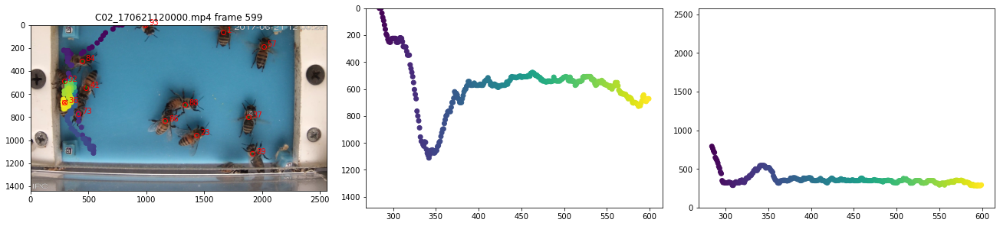

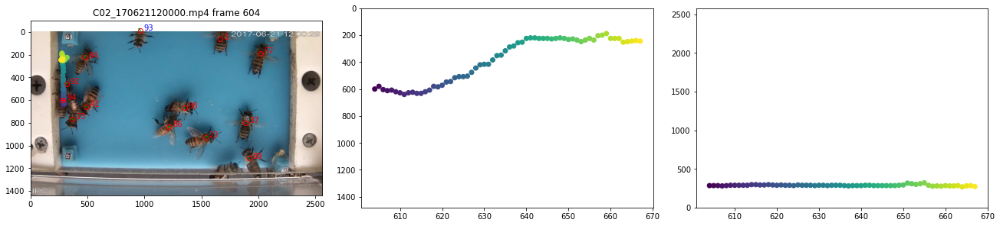

In [352]:
i,a,_,_=possible_pairs[3]
itemi=ddf[ddf.trackid==i].iloc[-1]
itema=ddf[ddf.trackid==a].iloc[0]
print(i,a)
bv.plottrack(ddf, videos, i, itemi.track_endframe)
bv.plottrack(ddf, videos, a, itema.track_startframe)

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


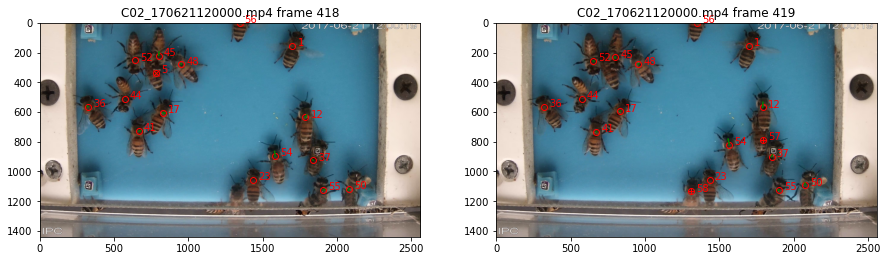

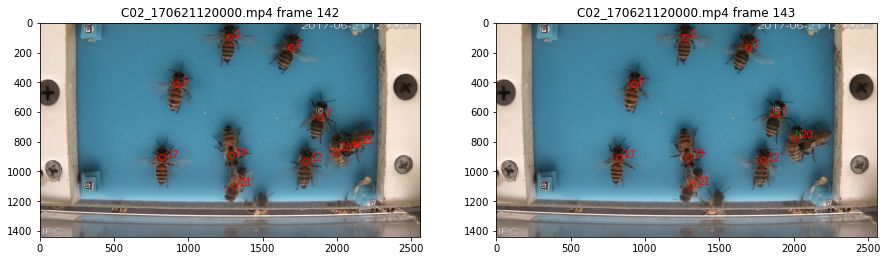

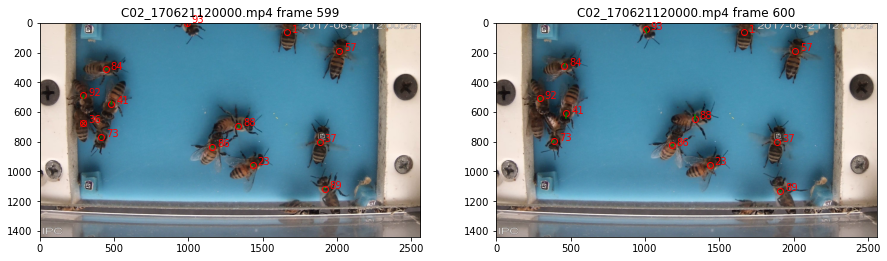

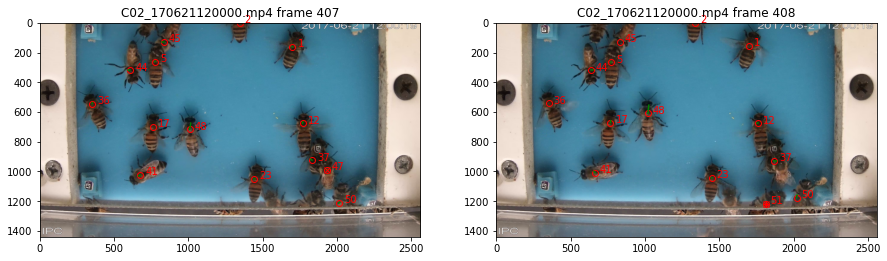

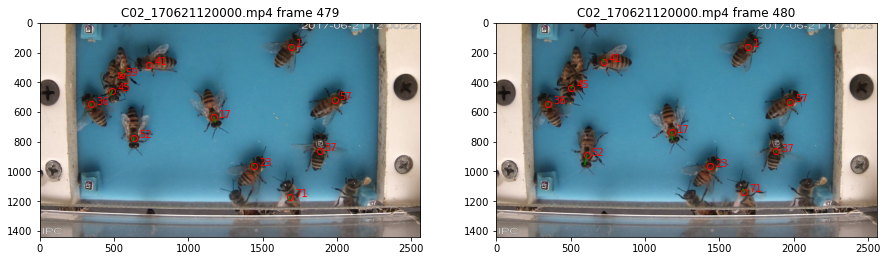

In [150]:
for f in intdf.frame.unique():
    fig,ax=plt.subplots(1,2,figsize=(15,8))
    ax=ax.ravel()
    plt.sca(ax[0])
    bv.plot1Frame(ddf,videos, 3,f, debug=False)
    plt.sca(ax[1])
    bv.plot1Frame(ddf,videos, 3,f+1, debug=False)

In [145]:
ddf[ddf.frame.isin([137,138,139,140])][['frame','trackid','cy','vx','vy','predicty']].astype(int)

,frame,trackid,cy,vx,vy,predicty
171,137,1,160,2,0,160
172,138,1,160,0,0,160
173,139,1,160,0,0,160
174,140,1,160,0,0,160
956,137,2,104,0,0,96
957,138,2,104,-2,0,104
958,139,2,100,2,-2,104
959,140,2,100,2,0,98
1546,137,5,412,0,0,412
1547,138,5,412,0,0,412


/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


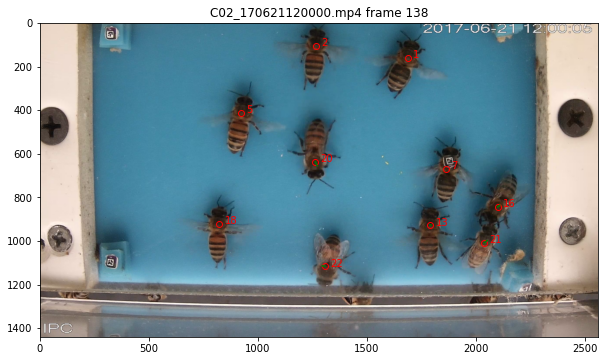

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


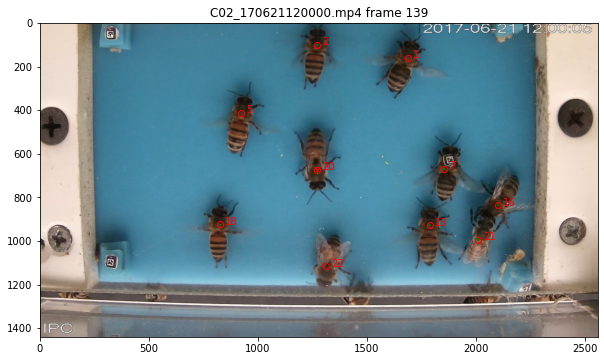

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


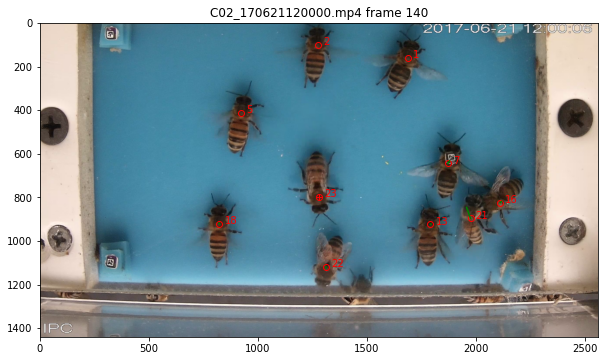

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


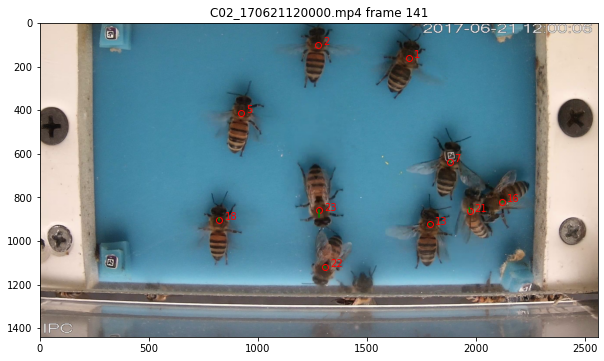

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


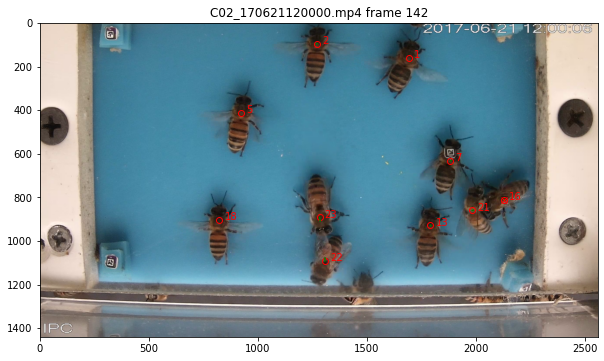

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


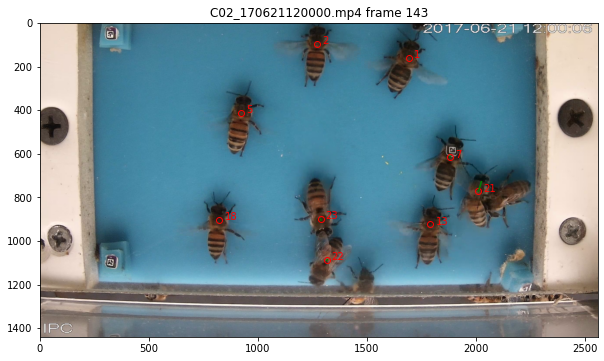

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4


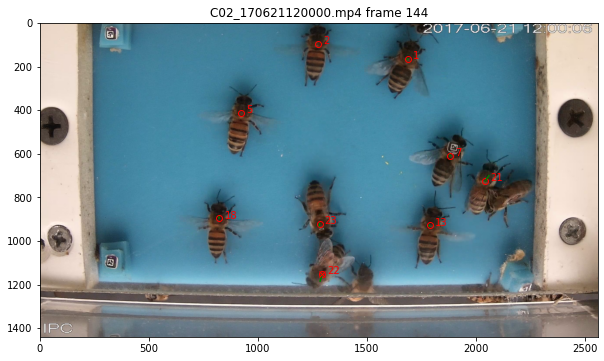

In [129]:
for f in range(138,145):
    fig = plt.figure(figsize=(10,8))
    bv.plot1Frame(ddf,videos, 3,f, debug=False)
    plt.show()

### Detect events

In [288]:
cdf

videoid  trackid
3        0             exit
         1            noise
         2            noise
         3             exit
         4            noise
                     ...   
         1176         noise
         1177         noise
         1178         noise
         1179         noise
         1180       walking
Length: 1181, dtype: object

In [289]:
cdf.value_counts()

noise               771
entrance            193
exit                160
walking              31
exit_partial         14
entrance_partial     12
dtype: int64

In [294]:
def crossings(track):
    outside=800
    
    return np.sum(np.diff(track.cy>outside)!=0)
    
crdf=ddf.groupby(['videoid','trackid']).apply(crossings)

In [298]:
crdf.value_counts()

0     739
1     330
2      41
3      23
4      10
5       7
7       6
10      3
13      3
11      3
9       3
8       3
6       3
15      2
18      1
23      1
26      1
30      1
77      1
dtype: int64

In [312]:
ccdf = pd.concat({'event':cdf,'crossings':crdf},axis=1)
ccdf.value_counts().sort_index()

event             crossings
entrance          1            170
                  3             10
                  5              4
                  7              1
                  9              2
                  11             2
                  15             2
                  23             1
                  77             1
entrance_partial  1              8
                  3              1
                  5              2
                  7              1
exit              1            139
                  3             11
                  5              1
                  7              4
                  9              1
                  11             1
                  13             3
exit_partial      1             13
                  3              1
noise             0            714
                  2             38
                  4              7
                  6              3
                  8              3
                  10       

5
N=418


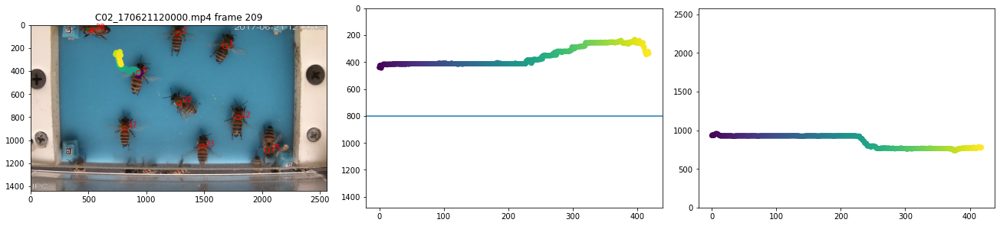

In [327]:
#trackid = cdf[cdf=='noise'].index[2][1]
#trackid = crdf[crdf==2].index[4][1]
trackid = intdf.trackid.unique()[0]
print(trackid)
bv.plottrack(ddf, videos, trackid)
plt.gcf().axes[1].axhline(800);

418 780.0 336.0


,track_startframe,cx,cy
trackid,,,
49,402,1764.0,1196.0
50,405,2004.0,1220.0
51,408,1812.0,1216.0
52,409,668.0,88.0
53,409,1596.0,1204.0
54,413,1564.0,1144.0
55,413,1884.0,1200.0
56,416,1344.0,0.0
57,419,1796.0,788.0


N=418
N=0


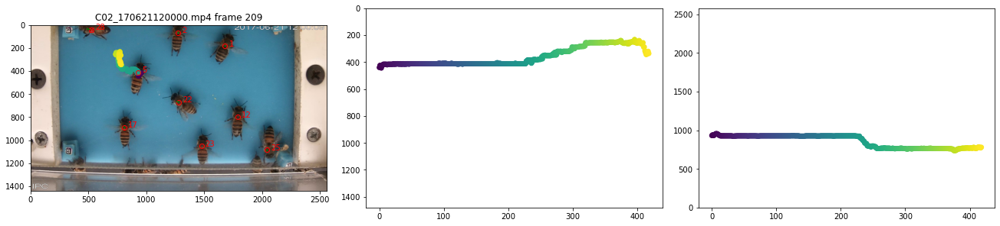

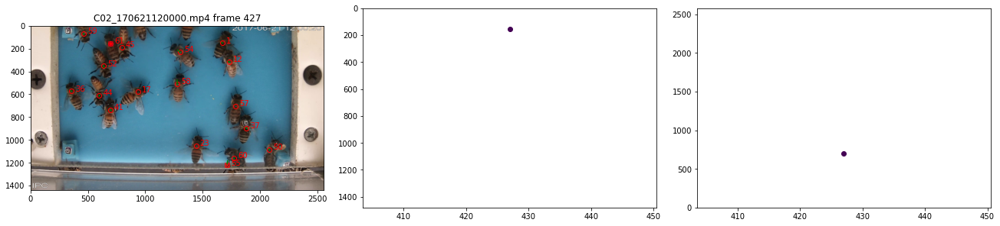

In [330]:
track=ddf[ddf.trackid==trackid]
end=track.iloc[-1]
pot = ddf[(np.abs(ddf.track_startframe-end.track_endframe)<20)]
print(end.frame,end.cx,end.cy)
display(pot.groupby('trackid').first()[['track_startframe','cx','cy']])

bv.plottrack(ddf, videos, trackid)
bv.plottrack(ddf, videos, 61)

## TAG_EVENT files

In [21]:
tracksroot='/mnt/storage/work/jchan/tag_merge'

In [7]:
%ls -lh {tracksroot}

total 19G
-rw-rw-r-- 1 jchan jchan 1.1G Apr  5 17:33 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621080000_fine_new.json
-rw-rw-r-- 1 jchan jchan 938M Apr  5 17:34 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621090000_fine_new.json
-rw-rw-r-- 1 jchan jchan 781M Apr  5 17:35 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621100000_fine_new.json
-rw-rw-r-- 1 jchan jchan 849M Apr  5 17:46 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json
-rw-rw-r-- 1 jchan jchan 1.1G Apr  5 17:48 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621130000_fine_new.json
-rw-rw-r-- 1 jchan jchan 1.4G Apr  5 17:50 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621140000_fine_new.json
-rw-rw-r-- 1 jchan jchan 1.5G Apr  5 17:52 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621150000_fine_new.json
-rw-rw-r-- 1 jchan jchan 1.6G Apr  5 17:54 TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621160000_fine_new.json
-rw-rw

In [22]:
from os import listdir
from os.path import isfile, join
files = [join(tracksroot,f) for f in listdir(tracksroot) if isfile(join(tracksroot, f)) and f.startswith('TAG_EVENT_pollen_Complete_v2')]
files=sorted(files)
files

['/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621080000_fine_new.json',
 '/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621090000_fine_new.json',
 '/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621100000_fine_new.json',
 '/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json',
 '/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621130000_fine_new.json',
 '/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621140000_fine_new.json',
 '/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621150000_fine_new.json',
 '/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621160000_fine_new.json']

In [18]:
mp4root='/mnt/storage/Gurabo/videos/Gurabo/mp4'

In [69]:
#%ls {mp4root}

In [23]:
videos=[]
for f in files:
    M=re.search('_(C\d{2}_\d{12})_',f)
    vid=join(mp4root,M.group(1)+'.mp4')
    print(vid)
    videos.append(vid)

/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621090000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621100000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621120000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621130000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621140000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621150000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621160000.mp4


### Manual check of file content

In [14]:
T=lb.load_tracks_json(files[0])

In [16]:
print(T['data']['276'][0])
print(T['data']['277'][0])

{'time': 13.8, 'id': '5', 'frame': '276', 'x': 1799.6095, 'y': 51.6095, 'cx': 1972.0, 'cy': 224.0, 'width': 344.781, 'height': 344.781, 'angle': 90, 'bool_acts': ['false', 'false', 'false', 'false'], 'notes': '', 'labels': ['Not_Event'], 'classifier': {'entering_leaving': {'Not_Event': {'length': 2616, 'start_position': [2108.0, 220.0, 1.2245677709579468], 'end_position': [1440.0, 552.0, 1.0378656387329102]}}}, 'tag': None}
{'time': 13.85, 'id': '5', 'frame': '277', 'x': 1795.6095, 'y': 63.6095, 'cx': 1968.0, 'cy': 236.0, 'width': 344.781, 'height': 344.781, 'angle': 90, 'bool_acts': ['false', 'false', 'false', 'false'], 'notes': '', 'labels': ['Not_Event'], 'classifier': {'entering_leaving': {'Not_Event': {'length': 2616, 'start_position': [2108.0, 220.0, 1.2245677709579468], 'end_position': [1440.0, 552.0, 1.0378656387329102]}}}, 'tag': None}


### Automatic importing

In [24]:
#out=extract_events(T, 8)
out = lb.extract_events_from_files(files)
df = pd.DataFrame(out)
df = lb.augment_df(df)
df

/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621080000_fine_new.json 2017-06-21 08:00:00
  Load
  Extract



/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621090000_fine_new.json 2017-06-21 09:00:00
  Load
  Extract



/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621100000_fine_new.json 2017-06-21 10:00:00
  Load
  Extract



/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json 2017-06-21 12:00:00
  Load
  Extract



/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621130000_fine_new.json 2017-06-21 13:00:00
  Load
  Extract



/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621140000_fine_new.json 2017-06-21 14:00:00
  Load
  Extract



/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621150000_fine_new.json 2017-06-21 15:00:00
  Load
  Extract



/mnt/storage/work/jchan/tag_merge/TAG_EVENT_pollen_Complete_v2_ID_nms_Track_merged_C02_170621160000_fine_new.json 2017-06-21 16:00:00
  Load
  Extract


NameError: name 'augment_df' is not defined

In [28]:
df.to_parquet("tag_event_ALL_NMS_170621_newaugmented.parquet")

In [29]:
%ls -lh "tag_event_ALL_NMS_170621_newaugmented.parquet"

-rw-rw-r-- 1 rmegret rmegret 78M Apr  8 12:11 tag_event_ALL_NMS_170621_newaugmented.parquet


In [9]:
df=pd.read_parquet("tag_event_ALL_NMS_170621_augmented.parquet")

In [11]:
df['entering']=df.entering_leaving=='entering'
df['leaving']=df.entering_leaving=='entering'

In [30]:
df.columns

Index(['videoid', 'trackid', 'frame', 'datetime', 'cx', 'cy', 'entering',
       'leaving', 'walking', 'pollen', 'tagid', 'taghamming', 'tx', 'ty',
       'tagdm', 'track_class', 'track_length', 'track_startx', 'track_starty',
       'track_starta', 'track_endx', 'track_endy', 'track_enda', 'hastag',
       'track_haspollen', 'track_hastag', 'track_tagid', 'track_startframe',
       'track_endframe', 'track_starttime', 'track_endtime'],
      dtype='object')

In [ ]:
#df = df['videoid trackid frame datetime endtime labels entering leaving pollen hastag tagid taghamming tag track_haspollen track_hastag track_tagid'.split()]

In [32]:
df[['track_class','pollen']].value_counts()

track_class  pollen
Not_Event    False     3990504
entering     False     2017027
leaving      False     1369174
Not_Event    True        76356
entering     True        30717
leaving      True        23713
dtype: int64

In [25]:
df['pollen'].value_counts()

False    7376705
True      130786
Name: pollen, dtype: int64

In [26]:
df['track_haspollen'].value_counts()

False    7376705
True      130786
Name: track_haspollen, dtype: int64

In [22]:
#df = df.rename(columns={'x':'cx','y':'cy'})

In [21]:
df[['hastag','track_hastag']].value_counts()

hastag  track_hastag
False   False           7399009
        True              55089
True    True              53393
dtype: int64

In [20]:
df[df.hastag].head().tag.to_dict()

{2359: {'c': array([1810.1, 1178.6]),
  'dm': 38.09,
  'goodness': 0.0,
  'hamming': 0.0,
  'id': 1621.0,
  'p': array([array([1793.26, 1166.41]), array([1822.33, 1162.02]),
         array([1827.36, 1191.1 ]), array([1797.38, 1195.88])], dtype=object),
  'rgb_mean': array([77.4, 80.8, 86. ])},
 2373: {'c': array([1774.2, 1163.8]),
  'dm': 33.83,
  'goodness': 0.0,
  'hamming': 1.0,
  'id': 1621.0,
  'p': array([array([1760.63, 1146.99]), array([1786.96, 1151.12]),
         array([1786.93, 1179.73]), array([1762.01, 1175.91])], dtype=object),
  'rgb_mean': array([80.2, 87.5, 92.9])},
 2402: {'c': array([1751.5, 1132.6]),
  'dm': 47.87,
  'goodness': 0.0,
  'hamming': 1.0,
  'id': 1621.0,
  'p': array([array([1738.25, 1117.68]), array([1762.36, 1118.74]),
         array([1765.84, 1148.75]), array([1739.85, 1147.49])], dtype=object),
  'rgb_mean': array([72.4, 73.1, 78.3])},
 2417: {'c': array([1781.9, 1103.8]),
  'dm': 48.79,
  'goodness': 0.0,
  'hamming': 1.0,
  'id': 1621.0,
  'p': ar

In [23]:
%ls -hl "tag_event_ALL_NMS_170621_augmented.parquet"

-rw-rw-r-- 1 rmegret rmegret 67M Apr  6 12:08 tag_event_ALL_NMS_170621_augmented.parquet


In [38]:
(df.track_endframe-df.track_startframe+1-df.track_length).unique()

array([0])

In [37]:
# Tagged tracks
tdf=df[df.track_hastag]

In [38]:
tdf.track_hastag.count()

159876

In [39]:
tdf.hastag.count()

159876

In [122]:
g=df.groupby(['videoid','trackid'])

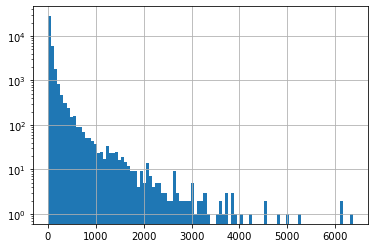

In [102]:
g.size().hist(bins=100)
plt.gca().set_yscale('log')

In [29]:
# Keep all detections
gdf=df
gdf.shape

(7507491, 12)

In [39]:
# Keep only first detection of each track
gdf=df.groupby(['videoid','trackid']).first().reset_index()
gdf.shape

(152135, 31)

In [56]:
def event_stats(gdf):
    times = pd.DatetimeIndex(gdf.datetime)
    ldf=gdf.copy()
    ldf['pollenentering']=gdf.pollen & gdf.entering
    ddf=ldf.groupby([times.hour])
    stats_total=ddf.track_class.count().rename('total')
    stats_enter=ddf.entering.sum().rename('entering')
    stats_leave=ddf.leaving.sum().rename('leaving')
    stats_pollen=ddf.pollen.sum().rename('pollen')
    stats_pollenenter=ddf.pollenentering.sum().rename('pollenentering')
    return pd.concat([stats_total,stats_leave,stats_enter,stats_pollen,stats_pollenenter],axis=1)

In [57]:
statsdf=event_stats(gdf)

In [58]:
statsdf

,total,leaving,entering,pollen,pollenentering
datetime,,,,,
8,27256,4043,3898,401,59
9,18540,2456,2945,354,54
10,10759,1691,1695,170,32
12,8290,1238,1343,104,18
13,13489,1802,1637,191,20
14,20348,2252,2286,370,34
15,21980,2404,2372,663,71
16,31473,3543,3011,500,47


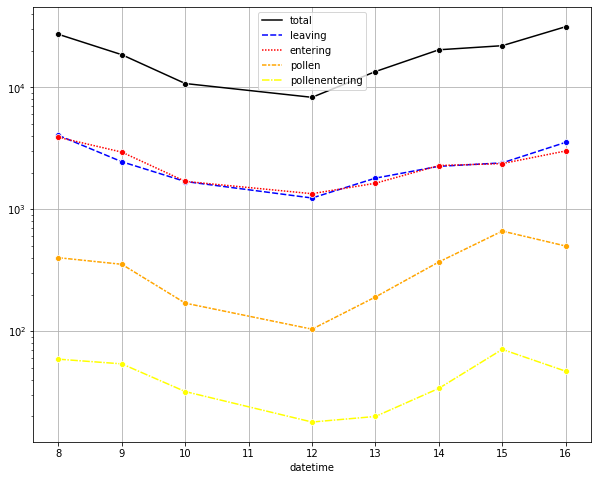

In [59]:
import seaborn as sns
fig=plt.figure(figsize=(10,8))
sns.lineplot(data=statsdf, palette=['k','b','r','orange','yellow'], marker='o')
plt.grid()
plt.yscale('log')

In [40]:
statsdf=event_stats(gdf[gdf.entering_leaving!="Not_Event"])

<AxesSubplot:xlabel='datetime'>

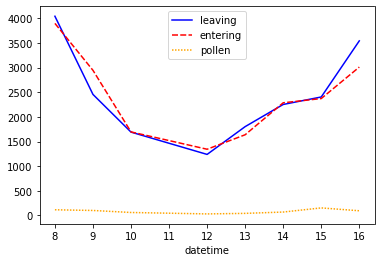

In [41]:
sns.lineplot(data=statsdf, palette=['b','r','orange'])

In [97]:
# Keep only first detection of each track for tagged bees
tgdf=df[df.track_hastag].groupby(['videoid','trackid']).nth(0).reset_index()
tgdf.shape

(1600, 31)

In [98]:
statsdf=event_stats(tgdf)
statsdf

,total,leaving,entering,pollen,pollenentering
datetime,,,,,
8,77,14,18,0,0
9,63,7,16,1,1
10,22,4,8,0,0
12,204,38,45,4,1
13,256,31,23,6,1
14,283,24,27,8,1
15,109,15,19,5,0
16,586,62,56,3,1


In [76]:
import beevideoutil.video as bv

In [221]:
def plotFrame(df, item, videos, frame=None, frame_ratio=None, fm=None, focus=False, focusr=300, show_track=False):

    fs=item.frame
    fe=item.frame+item.track_length-1
    
    if (fm is None):
        if (frame is not None):
            fm = frame
        elif (frame_ratio is not None):
            fm = item.frame + int((item.track_length-1)*frame_ratio)
        else:
            fm = item.frame+(item.track_length//2)
    
    print(fs,fm,fe)

    vidfile=videos[item.videoid]
    print(vidfile)
    I=bv.getFrame(vidfile,fm)
    
    df0=df[(df.videoid==item.videoid)]

    T=df0[df0.trackid==item.trackid].copy()
    T.set_index('frame', inplace=True)
    #print(T.iloc[0].length, T.frame)
    
    #print(list(T.index) )
    fm0=fm
    fm = T.index[T.index>=fm0].min()
    #print(fm)
    if (np.isnan(fm)):
        fm = T.index[T.index<=fm0].max()
    
    polidx=T.pollen
    
    T2=df0[(df0.tagid==item.tagid) & (np.abs(df0.frame-fm)<10)].copy()
    T2.set_index('frame', inplace=True)
    
    T3=df0[(df0.frame==fm)].copy()
    T3.set_index('frame', inplace=True)
    
    T4=T3[T3.trackid==item.trackid].copy()
    if (T4.shape[0]>0 and show_track):
        item0=T4.iloc[0]
        if item0.hastag:
            plt.scatter(item0.tx,item0.ty, s=30, color='c', marker='+', zorder=5)

    X,Y=T.loc[fm].cx,T.loc[fm].cy
    
    T4 = df[(df.videoid==item.videoid) & (df.tagid==item.tagid) & (np.abs(df.frame-fm)<20*20)]
    tracks=T4.trackid.unique()
    if show_track:
        for tid in tracks:
            T44 = T4[T4.trackid==tid]
            plt.plot(T44.cx,T44.cy, 'b.-')
    
    plt.imshow(I)
    if (show_track):
        plt.plot(T.cx,T.cy, 'r-')
        #plt.scatter(T[T.pollen].cx,T[T.pollen].cy, s=30, color=[1,1,0], marker='o', zorder=3, mfc=None)
        plt.scatter(T.cx,T.cy, s=20, c=T.index)
        plt.plot(T.loc[fm].cx,T.loc[fm].cy, 'b', marker='+', ms=50)
        plt.scatter(T[T.hastag].cx,T[T.hastag].cy, s=30, color=[0,1,0], marker='x', zorder=4)
    
        plt.scatter(T2[T2.hastag].cx,T2[T2.hastag].cy, s=20, color=[0,1,0], marker='o', zorder=4)
    
    
    plt.scatter(T3.cx,T3.cy, s=30, color='b', marker='+', zorder=5)
    plt.scatter(T3[T3.hastag].cx,T3[T3.hastag].cy, s=60, color='m', marker='x', zorder=6)
    
    if (focus):
        plt.xlim(X-focusr,X+focusr)
        plt.ylim(Y+focusr,Y-focusr)
    plt.title(vidfile.split('/')[-1]+f' frame {fm}')

In [133]:
tgdf.track_tagid.unique()

array([1621.,  516., 1786.,  677.,  509.,  638.,  197., 1651., 1361.,
       1652.,  397., 1609., 1109., 1725., 1237.,  930., 2564.,  533.,
        534., 2522., 1900., 2812., 1404., 1230., 2755., 1415., 1407.,
       2487., 1797., 2237., 2665.,  694.,  508., 1032.,  515.,  590.,
       2508.,  176., 1069., 2759., 2923.,  249., 1607., 1425., 1979.,
        126., 1420., 1864., 1698., 2891., 2180.,  270., 2650., 2750.,
       1780., 2190., 2285.,  517.,  407., 2754., 2747., 2602., 2640.,
       1722.,  352.,  440.,  488.,  377., 2930.,  869., 1951.,  705.,
       2874.,   24., 2489., 1958., 1259., 2048.,  750., 2946., 2666.,
        185.,  611., 2234., 2552.,  564., 2030.,  478.,  200.])

In [101]:
tgdf[tgdf.track_haspollen]

,videoid,trackid,frame,datetime,cx,cy,entering,leaving,walking,pollen,...,track_endy,track_enda,hastag,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,track_starttime,track_endtime
77,1,768,2239,2017-06-21 09:01:51.950,1740.0,1200.0,True,False,False,True,...,60.0,1.004858,False,True,True,1609.0,2239,2254,2017-06-21 09:01:51.950,2017-06-21 09:01:52.700
167,3,477,2701,2017-06-21 12:02:15.050,1252.0,1176.0,True,False,False,True,...,716.0,0.886105,False,True,True,1230.0,2701,3212,2017-06-21 12:02:15.050,2017-06-21 12:02:40.600
192,3,1760,12622,2017-06-21 12:10:31.100,2084.0,1060.0,False,False,True,True,...,1192.0,0.495171,False,True,True,1230.0,12622,12632,2017-06-21 12:10:31.100,2017-06-21 12:10:31.600
219,3,2559,20340,2017-06-21 12:16:57.000,896.0,1180.0,False,False,True,True,...,1128.0,1.019308,True,True,True,1230.0,20340,20373,2017-06-21 12:16:57.000,2017-06-21 12:16:58.650
314,3,4944,42501,2017-06-21 12:35:25.050,1000.0,1040.0,False,True,False,True,...,1156.0,0.757814,True,True,True,1230.0,42501,42589,2017-06-21 12:35:25.050,2017-06-21 12:35:29.450
471,4,4830,36498,2017-06-21 13:30:24.900,724.0,824.0,False,False,True,True,...,872.0,0.865107,True,True,True,1407.0,36498,36548,2017-06-21 13:30:24.900,2017-06-21 13:30:27.400
479,4,4872,36636,2017-06-21 13:30:31.800,748.0,856.0,False,False,True,True,...,888.0,1.061798,True,True,True,1407.0,36636,36661,2017-06-21 13:30:31.800,2017-06-21 13:30:33.050
585,4,12183,67690,2017-06-21 13:56:24.500,548.0,1148.0,False,False,True,True,...,1180.0,0.627588,True,True,True,1607.0,67690,67701,2017-06-21 13:56:24.500,2017-06-21 13:56:25.050
601,4,12971,70274,2017-06-21 13:58:33.700,1140.0,1096.0,True,False,False,True,...,1008.0,0.483917,True,True,True,1607.0,70274,70286,2017-06-21 13:58:33.700,2017-06-21 13:58:34.300
619,4,13427,71860,2017-06-21 13:59:53.000,1212.0,308.0,False,False,True,True,...,376.0,1.036648,True,True,True,1607.0,71860,71906,2017-06-21 13:59:53.000,2017-06-21 13:59:55.300


In [182]:
evs=tgdf.query('track_tagid==638')
#item=gdf.query('videoid==0 & trackid==29747').iloc[0]
#print(item.to_dict())
evs

,videoid,trackid,frame,datetime,cx,cy,entering,leaving,walking,pollen,...,track_endy,track_enda,hastag,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,track_starttime,track_endtime
7,0,3111,9431,2017-06-21 08:07:51.550,1112.0,1156.0,True,False,False,False,...,64.0,0.849035,True,False,True,638,9431,9505,2017-06-21 08:07:51.550,2017-06-21 08:07:55.250
33,0,8752,24405,2017-06-21 08:20:20.250,548.0,52.0,False,False,True,False,...,208.0,0.915623,False,False,True,638,24405,24430,2017-06-21 08:20:20.250,2017-06-21 08:20:21.500
34,0,8767,24426,2017-06-21 08:20:21.300,216.0,64.0,False,True,False,False,...,1104.0,0.738367,False,False,True,638,24426,24447,2017-06-21 08:20:21.300,2017-06-21 08:20:22.350
68,0,23889,63407,2017-06-21 08:52:50.350,832.0,1060.0,True,False,False,False,...,988.0,0.482967,False,False,True,638,63407,63416,2017-06-21 08:52:50.350,2017-06-21 08:52:50.800
69,0,23894,63416,2017-06-21 08:52:50.800,924.0,868.0,False,False,True,False,...,72.0,0.574588,True,False,True,638,63416,63440,2017-06-21 08:52:50.800,2017-06-21 08:52:52.000
76,0,26896,70793,2017-06-21 08:58:59.650,608.0,96.0,False,False,True,False,...,944.0,0.832051,True,False,True,638,70793,70803,2017-06-21 08:58:59.650,2017-06-21 08:59:00.150
96,1,7463,20762,2017-06-21 09:17:18.100,1728.0,1112.0,True,False,False,False,...,60.0,0.850807,True,False,True,638,20762,20786,2017-06-21 09:17:18.100,2017-06-21 09:17:19.300
99,1,9597,26783,2017-06-21 09:22:19.150,728.0,52.0,False,True,False,False,...,1100.0,0.694333,False,False,True,638,26783,26850,2017-06-21 09:22:19.150,2017-06-21 09:22:22.500
118,1,14950,49786,2017-06-21 09:41:29.300,2012.0,1112.0,True,False,False,False,...,48.0,0.769074,True,False,True,638,49786,49806,2017-06-21 09:41:29.300,2017-06-21 09:41:30.300
121,1,16134,57270,2017-06-21 09:47:43.500,448.0,52.0,False,False,True,False,...,112.0,0.787983,False,False,True,638,57270,57313,2017-06-21 09:47:43.500,2017-06-21 09:47:45.650


{'videoid': 0, 'trackid': 3111, 'frame': 9431, 'datetime': Timestamp('2017-06-21 08:07:51.550000'), 'cx': 1112.0, 'cy': 1156.0, 'entering': True, 'leaving': False, 'walking': False, 'pollen': False, 'tagid': 638, 'taghamming': 1, 'tx': 1113.6, 'ty': 1153.1, 'tagdm': 34.91, 'track_class': 'entering', 'track_length': 75, 'track_startx': 1112.0, 'track_starty': 1156.0, 'track_starta': 0.7510342001914978, 'track_endx': 972.0, 'track_endy': 64.0, 'track_enda': 0.8490352630615234, 'hastag': True, 'track_haspollen': False, 'track_hastag': True, 'track_tagid': 638, 'track_startframe': 9431, 'track_endframe': 9505, 'track_starttime': Timestamp('2017-06-21 08:07:51.550000'), 'track_endtime': Timestamp('2017-06-21 08:07:55.250000')}
109545    9431
109627    9436
109643    9437
109660    9438
109677    9439
109694    9440
109710    9441
109789    9446
109837    9449
109854    9450
Name: frame, dtype: int64
9431 9431 9505
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4
9431 9450 9505
/mn

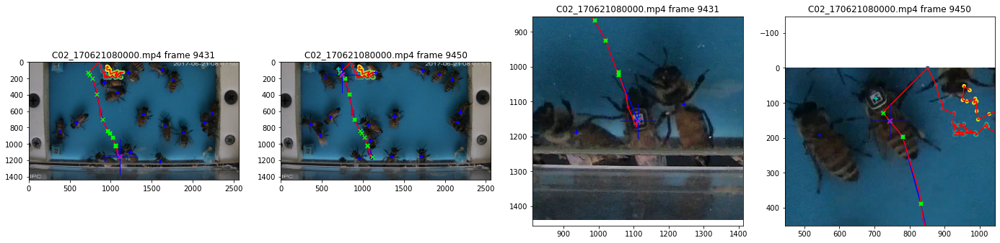

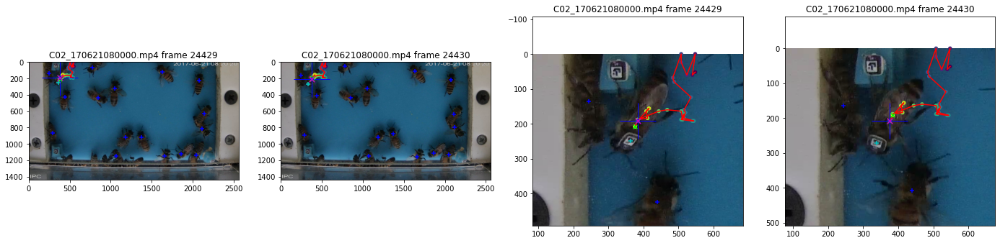

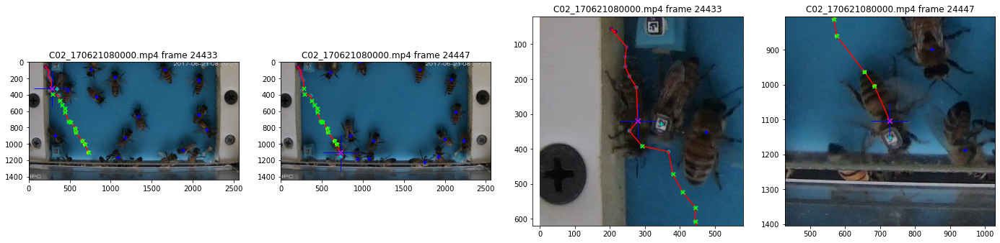

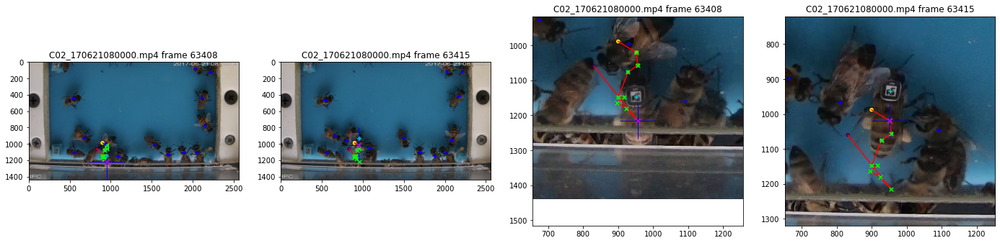

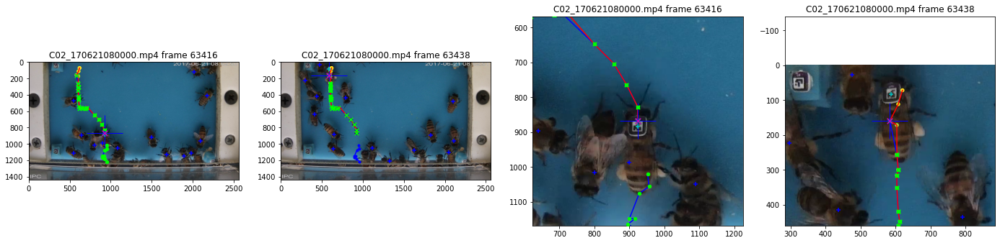

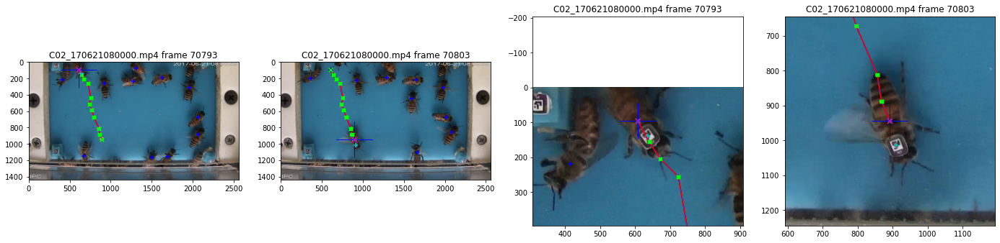

In [189]:
df0=df[df.videoid==0] 
for k,item in evs.iloc[:6].iterrows():
    print(item.to_dict())
    fig,ax=plt.subplots(1,4, figsize=(24,8))
    dff=df0[(df0.trackid==item.trackid)&(df0.tagid==item.track_tagid)]
    print(dff.frame)
    plt.sca(ax[0])   
    plotFrame(df, item, videos, fm=dff.iloc[0].frame)
    plt.sca(ax[1])   
    plotFrame(df, item, videos, fm=dff.iloc[-1].frame)
    plt.sca(ax[2])   
    plotFrame(df, item, videos, fm=dff.iloc[0].frame, focus=True)
    plt.sca(ax[3])   
    plotFrame(df, item, videos, fm=dff.iloc[-1].frame, focus=True)

In [1]:
df

NameError: name 'df' is not defined

In [ ]:
#ddf=gdf[gdf.pollen & (gdf.entering_leaving=='entering')].iloc[:10]
ddf=df[(df.videoid==0) & (df.tagid==638)]
N=ddf.shape[0]
cols=5
rows=(N+cols-1)//cols
fig,ax = plt.subplots(rows, cols, figsize=(8*cols,5*rows) )
ax=ax.ravel()
print(N)
for i,(k,item) in enumerate(ddf.iterrows()):
    print(item['videoid trackid frame tagid track_haspollen'.split()].to_dict())
    plt.sca(ax[i])
    plotFrame(df, item, videos, fm=47470, focus=False)

In [111]:
tgdf[tgdf.track_hastag]

,videoid,trackid,frame,datetime,cx,cy,entering,leaving,walking,pollen,...,track_endy,track_enda,hastag,track_haspollen,track_hastag,track_tagid,track_startframe,track_endframe,track_starttime,track_endtime
0,0,83,190,2017-06-21 08:00:09.500,1832.0,1172.0,True,False,False,False,...,36.0,0.612300,True,False,True,1621.0,190,224,2017-06-21 08:00:09.500,2017-06-21 08:00:11.200
1,0,798,2798,2017-06-21 08:02:19.900,1948.0,164.0,False,True,False,False,...,1060.0,1.056844,True,False,True,516.0,2798,2816,2017-06-21 08:02:19.900,2017-06-21 08:02:20.800
2,0,1322,4229,2017-06-21 08:03:31.450,648.0,1172.0,True,False,False,False,...,252.0,1.002767,False,False,True,516.0,4229,4262,2017-06-21 08:03:31.450,2017-06-21 08:03:33.100
3,0,1334,4270,2017-06-21 08:03:33.500,344.0,172.0,False,False,True,False,...,152.0,0.554294,True,False,True,516.0,4270,4271,2017-06-21 08:03:33.500,2017-06-21 08:03:33.550
4,0,2101,6809,2017-06-21 08:05:40.450,1116.0,1136.0,False,False,True,False,...,1144.0,0.700951,False,False,True,1786.0,6809,7005,2017-06-21 08:05:40.450,2017-06-21 08:05:50.250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,7,31082,70817,2017-06-21 16:59:00.850,856.0,900.0,False,False,True,False,...,724.0,0.795700,True,False,True,1607.0,70817,71100,2017-06-21 16:59:00.850,2017-06-21 16:59:15.000
1596,7,31191,71103,2017-06-21 16:59:15.150,792.0,720.0,False,False,True,False,...,656.0,0.904552,True,False,True,1607.0,71103,71198,2017-06-21 16:59:15.150,2017-06-21 16:59:19.900
1597,7,31235,71200,2017-06-21 16:59:20.000,796.0,648.0,False,False,True,False,...,304.0,0.542958,True,False,True,1607.0,71200,71632,2017-06-21 16:59:20.000,2017-06-21 16:59:41.600
1598,7,31358,71635,2017-06-21 16:59:41.750,480.0,304.0,False,False,True,False,...,284.0,0.524119,True,False,True,1607.0,71635,71637,2017-06-21 16:59:41.750,2017-06-21 16:59:41.850


In [178]:
tids

array([ 517,  638, 1230, 1237, 1361, 1407, 1415, 1607, 1609, 1621, 1698,
       1786, 1797, 1900, 1979])

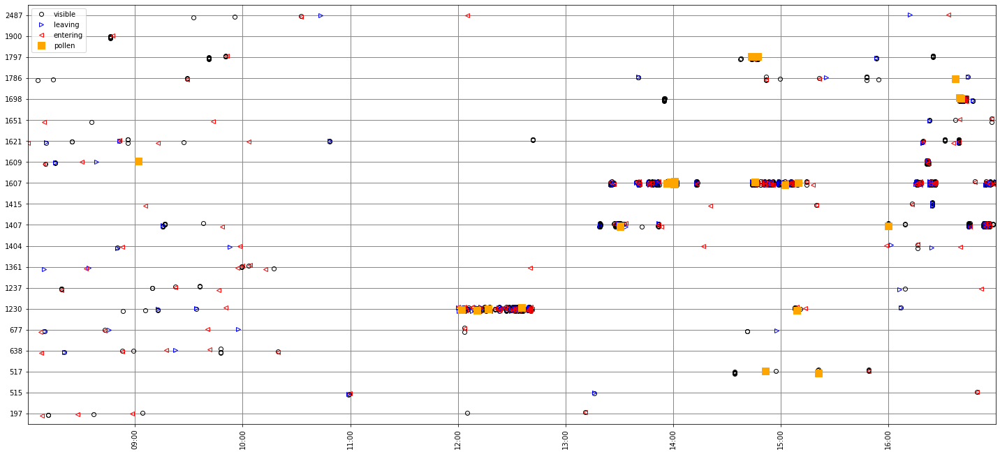

In [180]:
import matplotlib.dates as mdates
from datetime import datetime as dt

vdf = tgdf[tgdf.groupby('track_tagid').track_tagid.transform('size')>5]

tids = vdf.track_tagid.unique()
tids = np.sort(np.unique(tids)).astype(int)

vdf = tgdf[tgdf.track_tagid.isin(tids)]

#gdf2=gdf[gdf.tagid.isin([1230,508])]

fig,axes = plt.subplots(1,1,figsize=(20,10))
plt.sca(axes)
lb.plot_activities_df(vdf, plot_interval=True, tagids=tids);
#lb.plot_activities_df(df2, plot_interval=False);
plt.tight_layout();

ax=plt.gca()
hours = mdates.HourLocator() 
hourFmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(hours)
ax.xaxis.set_major_formatter(hourFmt)
#ax.set_xlim(dt(2017,6,21,13),dt(2017,6,21,14))

In [148]:
edf.id.unique()

array([1621, 1786,  677,  638, 2487,  197, 1651, 1361, 1609, 1237, 1404,
       1230, 2855, 2212, 1415, 1407, 1797,  212,  341, 1698,  611, 2464,
        517, 1607, 1979, 1147, 2945])

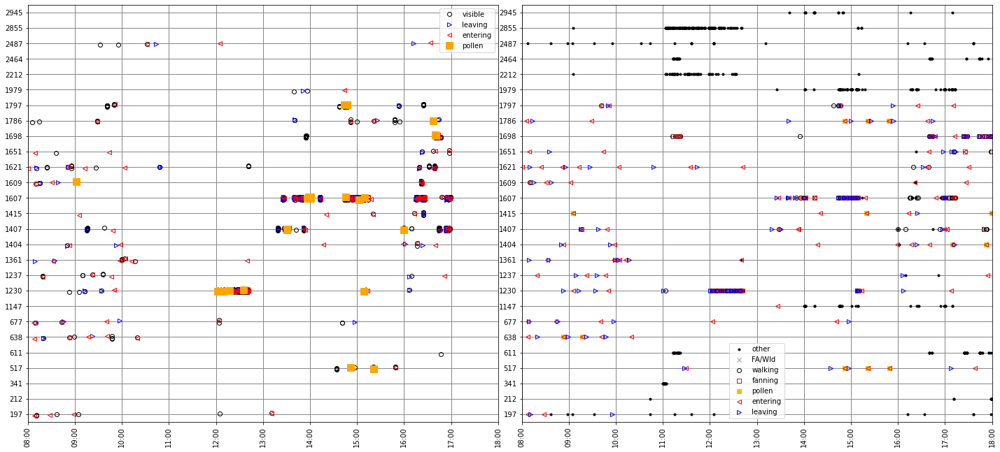

In [159]:
import matplotlib.dates as mdates
from datetime import datetime as dt

vdf = tgdf[tgdf.groupby('track_tagid').track_tagid.transform('size')>10]
edf = evts[evts.groupby('id').id.transform('size')>10]

tids = vdf.track_tagid.unique()
tids = np.concatenate([tids, edf.id.unique()])
tids = np.sort(np.unique(tids)).astype(int)

vdf = tgdf[tgdf.track_tagid.isin(tids)]
edf = evts[evts.id.isin(tids)]

#gdf2=gdf[gdf.tagid.isin([1230,508])]

fig,axes = plt.subplots(1,2,figsize=(20,10))
plt.sca(axes[0])
lb.plot_activities_df(vdf, plot_interval=True, tagids=tids);
#lb.plot_activities_df(df2, plot_interval=False);
plt.tight_layout();

ax=plt.gca()
hours = mdates.HourLocator() 
hourFmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_locator(hours)
ax.xaxis.set_major_formatter(hourFmt)
ax.set_xlim(dt(2017,6,21,8),dt(2017,6,21,18))

plt.sca(axes[1])
lb.plot_activities(edf, tagids=tids);
ax=plt.gca()
ax.set_xlim(dt(2017,6,21,8),dt(2017,6,21,18))
ax.xaxis.set_major_locator(hours)
ax.xaxis.set_major_formatter(hourFmt)


/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4
/mnt/storage/Gurabo/videos/Gurabo/mp4/C02_170621080000.mp4


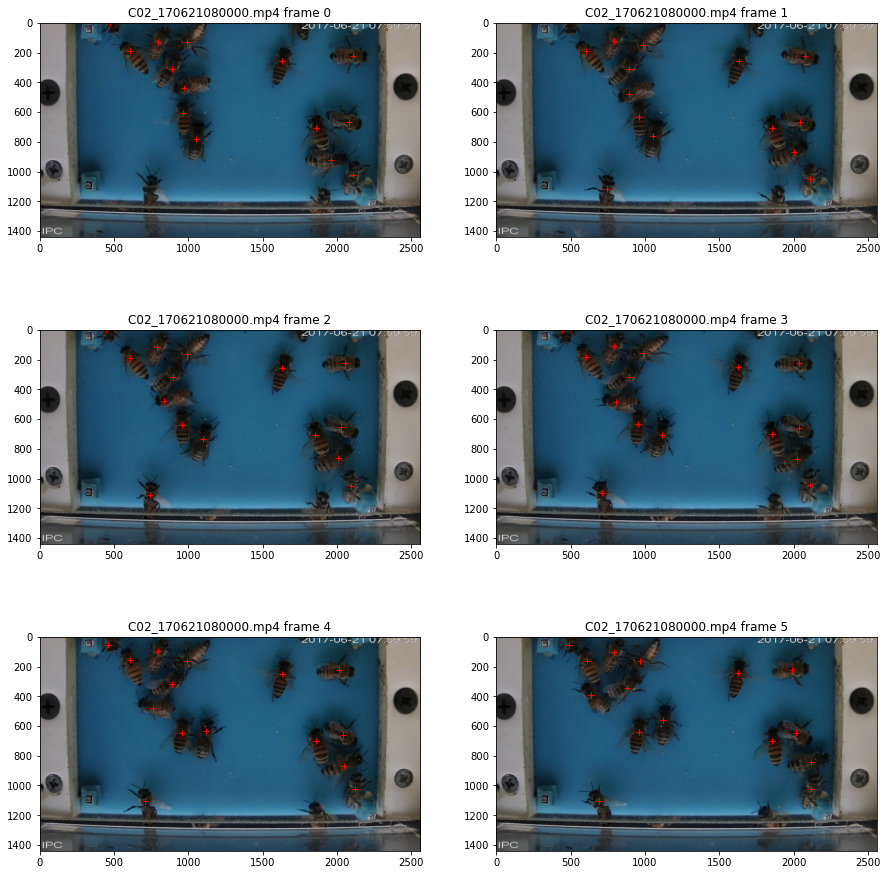

In [192]:
fig,ax=plt.subplots(3,2, figsize=(3*5.0, 2*8.0))
ax=ax.ravel()
for i,f in enumerate(range(6)):
    plt.sca(ax[i])
    bv.plot1Frame(df, videos, 0, f)

# Manual annotations

In [122]:
#annotationroot='/Users/megret/Documents/Research/BeeTracking/Soft/labelbeeconvert/data/drive-download-20181001'
annotationroot='/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001'

In [123]:
from os import listdir
from os.path import isfile, join
afiles = [join(annotationroot,f) for f in listdir(annotationroot) if isfile(join(annotationroot, f))]
afiles=sorted(afiles)
afiles[:10]

['/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620070000-Tracks-20180802_141631 - Ivan D Collado Hernandez.json',
 '/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620080000-Tracks-20180922_161322 - Patricia A Arsuaga Hernandez.json',
 '/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620090000-Tracks-20180801_150419 - Edwin M Caraballo Sanchez.json',
 '/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620100000-Tracks-20180731_163951 - Edwin J Rivera Colon.json',
 '/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620110000-Tracks-20180731_005651-Luis S. Gonzalez - Luis Gonzalez Medina.json',
 '/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620120000-Tracks-20180730_150118 - Isada Claudio Ford.json',
 '/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620130000-Tracks

In [124]:
adff=lb.define_fileset(afiles)

In [125]:
adff=adff[(adff.daystamp=='170621') & (adff.hh>=8) & (adff.hh<=17)]

In [151]:
T = lb.load_tracks_json('/mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170620070000-Tracks-20180802_141631 - Ivan D Collado Hernandez.json')

In [157]:
i=0
while not T[i]:
    i=i+1

In [158]:
T[i]

{'495': {'ID': 495,
  'time': 11.4,
  'frame': 228,
  'x': 1523.8277710109621,
  'y': 1086.5640682095004,
  'cx': 0,
  'cy': 0,
  'width': 93.54445797807551,
  'height': 81.07186358099878,
  'marked': False,
  'permanent': False,
  'angle': 161.45091630909752,
  'bool_acts': [False, False, False, False],
  'notes': '',
  'labels': 'wrongid',
  'tag': {'id': 495,
   'c': [1570.6, 1127.1],
   'hamming': 2,
   'p': [[1591.72, 1136.21],
    [1559.56, 1145.4],
    [1550.47, 1118.31],
    [1581.34, 1109.27]],
   'goodness': 0,
   'dm': 27.82,
   'rgb_mean': [123.8, 113.5, 106.4],
   'frame': 228}}}

In [127]:
adf = lb.load_annotations(adff)

Loading /mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170621080000-Tracks-20180922_150626 - Claudia Sofia Cordero Martinez.json...
Loading /mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170621090000-Tracks-20180926_115304 - Claudia Sofia Cordero Martinez.json...
Loading /mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170621100000-Tracks-20180731_110450 - Patricia A Arsuaga Hernandez.json...
Loading /mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170621110000-Tracks-20180802_152804 - COURTNEY A GEORGE-FELIX.json...
Loading /mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170621120000-Tracks-20180803_141522 - Patricia A Arsuaga Hernandez.json...
Loading /mnt/storage/Gurabo/datasets/gurabo1/annotations/drive-download-20181001/C02_170621130000-Tracks-20180221_112914 - Janpierre Aleman Rios.json...
Loading /mnt/storage/Gurabo/datasets/gurabo1/ann

In [131]:
evts = adf#[adf.pollen | adf.entering | adf.leaving].copy()
evts.dtypes

frame                int64
id                   int64
leaving               bool
entering              bool
pollen                bool
walking               bool
fanning               bool
FA                    bool
labels              object
time        datetime64[ns]
datetime    datetime64[ns]
uid                  int64
dtype: object

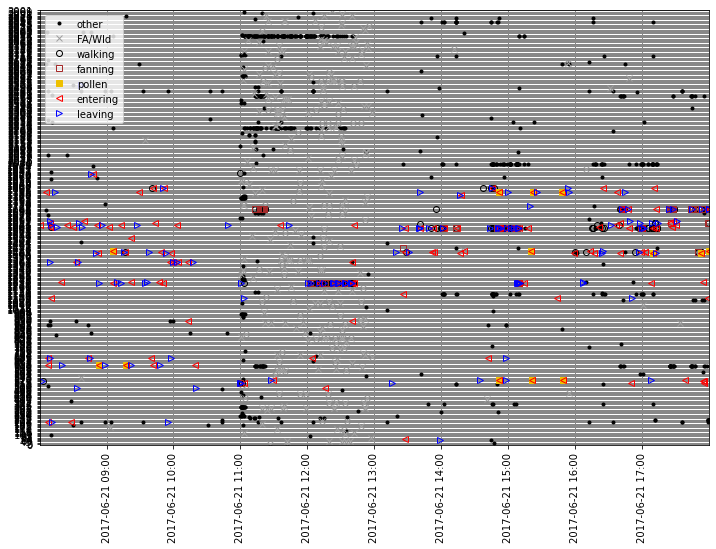

In [129]:
fig=plt.figure(figsize=(12,8))
lb.plot_activities(evts);

In [44]:
E = evts[['video', 'datetime', 'date', 'time', 'frame', 'id', 'labels', 'leaving', 'entering', 'pollen', 'walking',
             'fanning', 'falsealarm', 'wrongid' ]].copy()
E = E.query('falsealarm!=True & wrongid!=True').copy()
cols=['leaving','entering','pollen','walking','fanning','falsealarm','wrongid']
E[cols]=E[cols].astype('int')
E=E.drop(['falsealarm', 'wrongid'], axis=1)
E.head()

KeyError: "['falsealarm', 'video', 'wrongid', 'date'] not in index"

In [15]:
E.to_csv('../170620-170627.csv')

In [45]:
cols=['leaving','entering','pollen','walking','fanning','falsealarm','wrongid']
evts[cols]=evts[cols].astype('bool')
evts.head()

KeyError: "['wrongid', 'falsealarm'] not in index"

In [ ]:
fig = plt.subplots(1,1,figsize=(20,10))
evts_val = evts.query('falsealarm!=True & wrongid!=True & id<1800 &id>90 & not(id>700 & id<1000)').copy()
evts_val.index = range(evts_val.shape[0])
evts_val.reindex()
lb.plot_activities(evts_val);
plt.tight_layout();

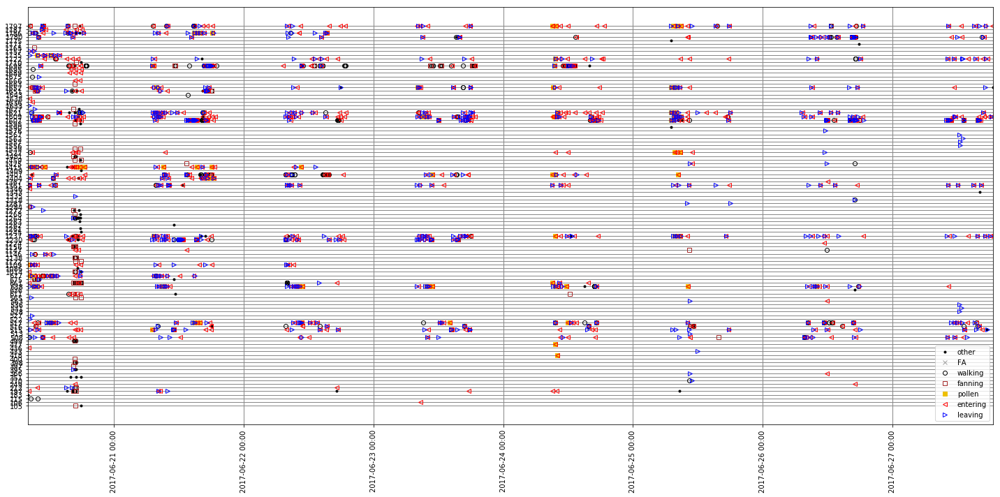

In [10]:
fig = plt.subplots(1,1,figsize=(20,10))
lb.plot_activities(evts_val);
plt.tight_layout();

In [61]:
# Remove FA and WId, keep only entering/leaving
cleaned = evts.query('falsealarm!=True & wrongid!=True')
# Remove bees with less than 4 events
evts_filtered = cleaned.groupby('id').filter(lambda x: len(x) >= 4).copy()
ids=evts_filtered['id'].unique()
print(ids.shape, ' kept ids')

evts_walking = evts_filtered.query('falsealarm!=True & wrongid!=True & (walking)')
evts_fanning = evts_filtered.query('falsealarm!=True & wrongid!=True & (fanning)')
evts_foraging = evts_filtered.query('falsealarm!=True & wrongid!=True & (entering | leaving)')

#evts_val = filtered.query('falsealarm!=True & wrongid!=True & id<1800 &id>90 & not(id>700 & id<1000)').copy()
#evts_val.index = range(evts_val.shape[0])
#evts_val.reindex();

(84,)  kept ids


/Users/megret/anaconda/envs/bnl/lib/python3.5/site-packages/pandas/core/frame.py:3140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]
/Users/megret/anaconda/envs/bnl/lib/python3.5/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/Users/megret/anaconda/envs/bnl/lib/python3.5/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

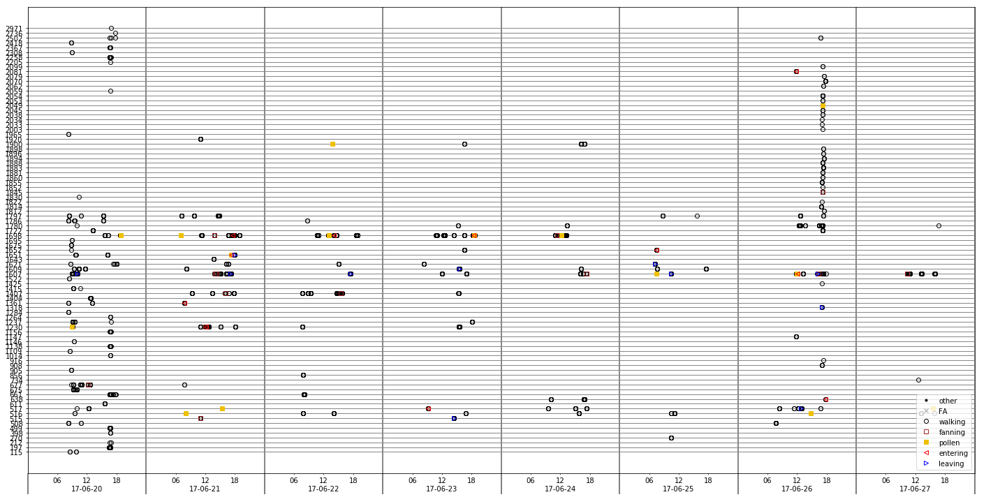

In [29]:
import matplotlib.dates as dates
import matplotlib.ticker as ticker

fig = plt.subplots(1,1,figsize=(20,10))
#plt.plot(evts['frame'],evts['id'],'o')

# Remove FA and WId, keep only entering/leaving
cleaned = evts.query('falsealarm!=True & wrongid!=True & (entering | leaving)')
evts_walking = evts.query('falsealarm!=True & wrongid!=True & (walking)')

# Remove bees with less than 4 events
evts_val = cleaned.groupby('id').filter(lambda x: len(x) >= 4).copy()

#evts_val = filtered.query('falsealarm!=True & wrongid!=True & id<1800 &id>90 & not(id>700 & id<1000)').copy()
evts_val.index = range(evts_val.shape[0])
evts_val.reindex()

#lb.plot_activities(evts_val);
lb.plot_activities(evts_walking);

plt.xlim(pd.to_datetime('2017-06-20 00:00'),pd.to_datetime('2017-06-28 00:00'))

def format_multiday():
    ax=plt.gca()
    def format_date(x, pos=None):
        d=dates.num2date(x)
        if d.hour==12:
            return d.strftime('%H\n%y-%m-%d')
        else:
            return d.strftime('%H')
    ax.xaxis.set_major_locator(dates.HourLocator([0]))
    ax.xaxis.set_minor_locator(dates.HourLocator([6,12,18]))
    #ax.xaxis.set_major_formatter(dates.DateFormatter('%y-%m-%d'))
    #ax.xaxis.set_minor_formatter(dates.DateFormatter('%H'))
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.xaxis.set_minor_formatter(ticker.FuncFormatter(format_date))
    plt.legend(loc=4)
    #plt.xticks(pd.date_range('2017-06-21 00:00','2017-06-27 00:00'),rotation=0)
    plt.xticks(horizontalalignment="left")
    ax.tick_params('x', length=30, width=2, which='major',color='gray')

    import matplotlib.transforms
    plt.setp( ax.xaxis.get_majorticklabels(), rotation=0) 

    ax.grid(b=True, which='major', axis='x', linewidth=2)

    # Create offset transform by 5 points in x direction
    dx = 5/72.; dy = 15/72. 
    fig = plt.gcf()
    offset = matplotlib.transforms.ScaledTranslation(dx, dy, fig.dpi_scale_trans)

    # apply offset transform to all x ticklabels.
    for label in ax.xaxis.get_majorticklabels():
        label.set_transform(label.get_transform() + offset)

    plt.tight_layout();

format_multiday()

In [13]:
#evts_val.set_index('datetime', drop=False, inplace=True)
#d=evts_val.groupby(['id',pd.Grouper(freq='1h')]).count()
d = evts_val.copy()

In [70]:
d=cleaned.copy()
ids = d['id'].unique()
revmap={}
for i,id in enumerate(ids):
    revmap[id]=i
d['k'] = d['id'].map(lambda i:revmap[i])

In [79]:
ids = evts_foraging['id'].unique()
print(len(ids),' ids')
def quant(evts, ids):
    d = evts.copy()
    #d=d.reset_index()
    #times = e['datetime'].unique()
    #ids = d['id'].unique()
    revmap={}
    for i,id in enumerate(ids):
        revmap[id]=int(i)
    
    dates=pd.date_range('2017-06-20', periods=8*24, freq='1H')

    def domap(i):
        if (i in ids): 
            return revmap[i]; 
        else: 
            return np.nan
    
#    d['k'] = d['id'].astype('category').cat.codes
    d['k'] = d['id'].map(domap)
    d['l'] = pd.cut(d['datetime'],dates,labels=range(len(dates)-1)).astype('int')
    #e.plot.line('datetime','id',style='.')

    A=np.zeros((len(ids),len(dates)))
    for _,item in d.iterrows():
        if (np.isnan(item['k'])): continue
        A[int(item['k']),item['l']]=1
    return A,ids
        
A_fanning,ids=quant(evts_fanning, ids)
A_walking,ids=quant(evts_walking, ids)
A_foraging,ids=quant(evts_foraging, ids)

56  ids


In [80]:
A_fanning.shape

(56, 192)

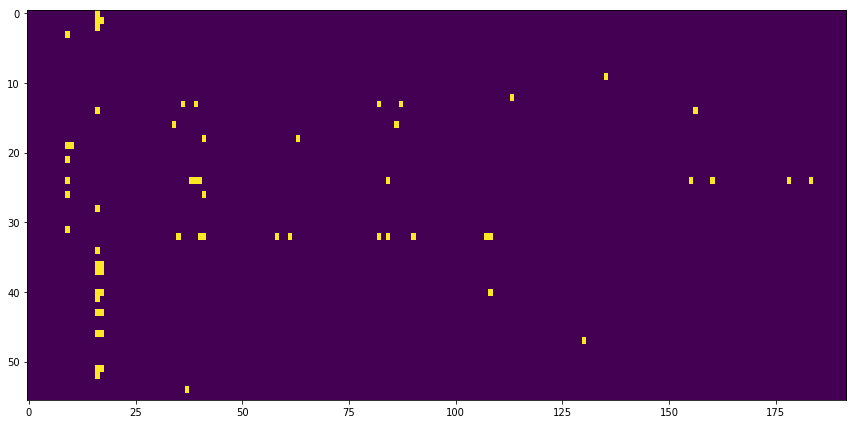

In [81]:
plt.figure(figsize=(12,6))
plt.imshow(A_fanning)
plt.axis('auto')
plt.tight_layout()

In [113]:
import skimage.io

def plotA(A, basename, ids):
    N=A.shape[0]
    B=A.reshape((N,8,24))
    
    for k in range(B.shape[0]):
        #skimage.io.imsave(basename+'-'+str(k)'+.png',B[k])
        np.savetxt(basename+'-'+str(ids[k])+'.csv', B[k], delimiter=",", fmt='%i') 

    ks=[]
    c=[]
    for i,b in enumerate(B):
        if (sum(b.ravel())>1): 
            ks.append(i)
            c.append(sum(b.ravel()))
    kk=np.argsort(np.array(c))
    kk=kk[::-1]
    ks=np.array(ks)
    
    kk=np.array(range(N))
    ks=np.array(range(N))

    nx=8
    fig,ax=plt.subplots((len(ks)+nx-1)//nx,nx,figsize=(20,12))
    ax=ax.ravel()
    for i,k in enumerate(ks[kk]):
        b=B[k]
        plt.sca(ax[i])
        plt.imshow(b)
        plt.axis('auto')
        plt.title(ids[i])
    plt.tight_layout()

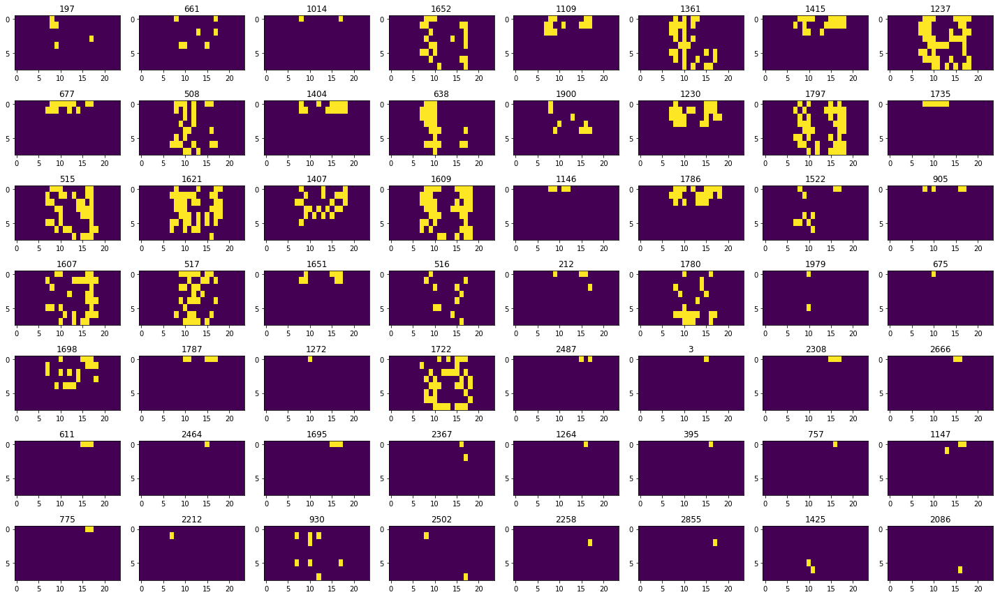

In [114]:
plotA(A_foraging, '../images/foraging', ids)

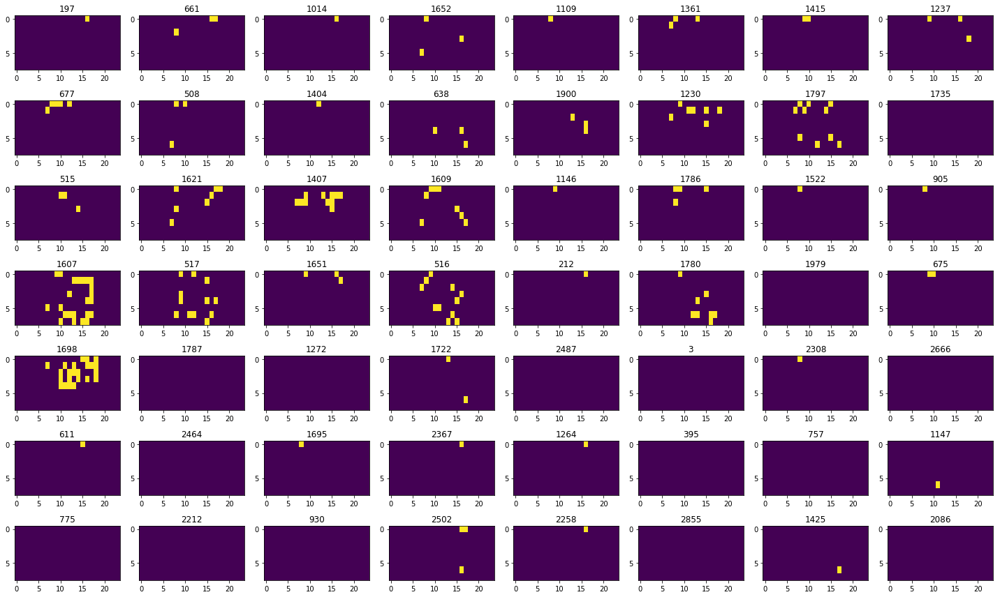

In [115]:
plotA(A_walking, '../images/walking', ids)

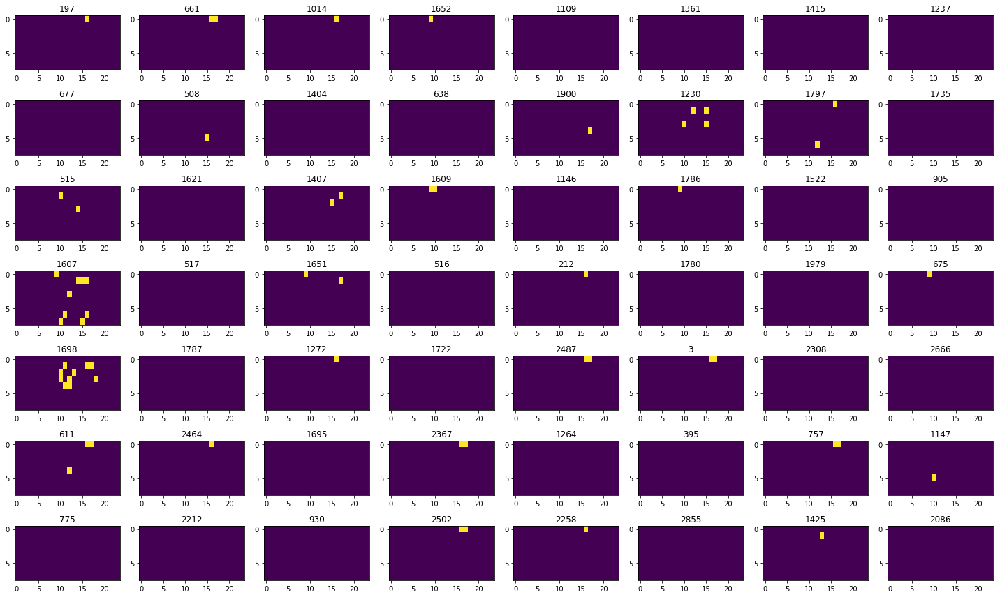

In [116]:
plotA(A_fanning, '../images/walking', ids)

# Ivan data one week

In [4]:
%cd /mnt/storage/work/irodriguez/detections/one_week/

/mnt/storage/work/irodriguez/detections/one_week


In [29]:
%ls -l -t Count_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json

-rw-rw-r-- 1 irodriguez irodriguez 263 Apr 26  2019 Count_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json


In [30]:
!head Count_v2_ID_nms_Track_merged_C02_170621120000_fine_new.json

{"leaving": 1238, "entering": 1343, "entering-leaving": 0, "walking": 0, "inside": 1111, "inside_out": 961, "inside_ramp": 257, "ramp_ramp": 268, "ramp_outside": 277, "ramp_inside": 202, "outside": 1295, "outside_inside": 1112, "outside_ramp": 231, "noise": 2559}

In [31]:
!head Count_ID_Track_merged_C02_170621080000_fine_new.json

{"entrance_entrance": 1928, "entrance_leaving": 2636, "leaving_leaving": 5680, "leaving_entrance": 3062, "ramp_entrance": 701, "ramp_leaving": 835}

In [34]:
%ls tr*

ls: cannot access 'tr*': No such file or directory


In [32]:
!head TRK_Pollen_Raw_merged_C02_170621100000_fine_new.json

{"1.0": [[0, 1.0, 0], [0, 1.0, 1]], "2.0": [[0, 1.0, 0], [0, 1.0, 1], [0, 1.0, 2], [0, 1.0, 3], [0, 1.0, 4], [0, 1.0, 5], [0, 1.0, 6], [0, 1.0, 7], [0, 1.0, 8], [0, 1.0, 9], [0, 1.0, 10], [0, 1.0, 11], [0, 1.0, 12], [0, 1.0, 13], [0, 1.0, 14], [0, 1.0, 15], [0, 1.0, 16], [0, 1.0, 17], [0, 1.0, 18], [0, 1.0, 19], [0, 1.0, 20], [0, 1.0, 21], [0, 1.0, 22], [0, 1.0, 23], [0, 1.0, 24], [0, 1.0, 25], [0, 1.0, 26], [0, 1.0, 27], [0, 1.0, 28], [0, 1.0, 29], [0, 1.0, 30], [0, 1.0, 31], [0, 1.0, 32], [0, 1.0, 33], [0, 1.0, 34], [0, 1.0, 35], [0, 1.0, 36], [0, 1.0, 37], [0, 1.0, 38], [0, 1.0, 39], [0, 1.0, 40], [0, 1.0, 42], [0, 1.0, 43], [0, 1.0, 50], [0, 1.0, 51], [0, 1.0, 52]], "3.0": [], "4.0": [[0, 1.0, 0], [0, 1.0, 1], [0, 1.0, 2], [0, 1.0, 3], [0, 1.0, 4], [0, 1.0, 5], [0, 1.0, 6], [0, 1.0, 7], [0, 1.0, 8], [0, 1.0, 9], [0, 1.0, 10], [0, 1.0, 11], [0, 1.0, 12], [0, 1.0, 13], [0, 1.0, 14], [0, 1.0, 15], [0, 1.0, 16], [0, 1.0, 17], [0, 1.0, 18], [0, 1.0, 19], [0, 1.0, 20], [0, 1.0, 21], [0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
%ls -l -t EVENT_Complete_ID_Track_merged_C02_170621??0000_fine_new.json

-rw-rw-r-- 1 irodriguez irodriguez 240135159 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621170000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 322917646 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621160000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 304292491 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621150000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 268160999 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621140000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 222392726 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621130000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 166966600 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621120000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 170274537 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621110000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 156557031 Dec 19  2018 EVENT_Complete_ID_Track_merged_C02_170621100000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 18814

In [24]:
%ls -l -t TRK_Pollen_Raw_nms_idx_merged_C02_170621??0000_fine_new.json

-rw-rw-r-- 1 irodriguez irodriguez 21438450 Apr 28  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621170000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 28129494 Apr 27  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621160000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 27402106 Apr 27  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621150000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 24486600 Apr 27  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621140000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 22033487 Apr 27  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621130000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 17191581 Apr 27  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621120000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 17497786 Apr 26  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621110000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 15395516 Apr 26  2019 TRK_Pollen_Raw_nms_idx_merged_C02_170621100000_fine_new.json
-rw-rw-r-- 1 irodriguez irodriguez 16500149 Apr 26  2019

In [50]:
import json
def loadjson(filename):
    with open(filename) as fp:
        obj = json.load(fp)
    return obj

In [51]:
EVENT = loadjson('EVENT_Complete_v2_ID_nms_Track_merged_C02_170628170000_fine_new.json')

In [59]:
obj=EVENT
obj['info']
frame='0'
k=3
obj['data'][frame][k]


{'time': 0.0,
 'id': '4',
 'frame': '0',
 'x': 667.6095,
 'y': 47.6095,
 'cx': 840.0,
 'cy': 220.0,
 'width': 344.781,
 'height': 344.781,
 'angle': 90,
 'bool_acts': ['false', 'false', 'false', 'false'],
 'notes': '',
 'labels': ['Not_Event'],
 'classifier': {'entering_leaving': {'Not_Event': {'length': 117,
    'start_position': [840.0, 220.0, 1.047149896621704],
    'end_position': [532.0, 528.0, 0.7429913878440857]}}}}

In [63]:
%ls -lh merged_C02_170626110000_fine_new.json

-rw-rw-r-- 1 irodriguez irodriguez 471M Dec 14  2018 merged_C02_170626110000_fine_new.json


In [35]:
merged = loadjson('merged_C02_170626110000_fine_new.json')

In [54]:
obj=merged
frame='50'
obj[frame]
k=20
obj[frame]['mapping'][k]  # [[x1,y1],[x2,y2],score,angle,?,[partid1,partid2]]
#obj[frame]['parts'][partid] # [[x,y,score],...]

[[2180, 860],
 [2244, 876],
 1.0850621461868286,
 65.96969000988257,
 -165.96375653207352,
 [3, 2]]

In [62]:
%ls -lh TAG_Complete_ID_Track_merged_C02_170621120000_fine_new.json

-rw-rw-r-- 1 irodriguez irodriguez 161M Nov 28  2018 TAG_Complete_ID_Track_merged_C02_170621120000_fine_new.json


In [64]:
tagcomplete = loadjson('TAG_Complete_ID_Track_merged_C02_170621120000_fine_new.json')

In [68]:
obj=tagcomplete
obj['info']
frame='0'
k=0
obj['data'][frame][k]

{'time': 0.0,
 'id': '1',
 'frame': '0',
 'x': 591.6095,
 'y': -48.3905,
 'cx': 764,
 'cy': 124,
 'width': 344.781,
 'height': 344.781,
 'angle': 90,
 'bool_acts': ['false', 'false', 'false', 'true'],
 'notes': '',
 'labels': 'Exit_from_top'}

In [22]:
!grep -n pol EVENT_Complete_ID_Track_merged_C02_170621??0000_fine_new.json

In [26]:
!grep -n Pol TRK_Pollen_Raw_nms_idx_merged_C02_170621??0000_fine_new.json

In [69]:
trkpollenidx = loadjson('TRK_Pollen_Raw_nms_idx_merged_C02_170621120000_fine_new.json')

In [83]:
obj = trkpollenidx
list(obj.keys())[300:400]
obj['(50, 2)']   # (frame, detectionid) ?

[[0, 1.0, 50]]

In [73]:
trkpollen = loadjson('TRK_Pollen_Raw_merged_C02_170621120000_fine_new.json')

In [76]:
obj = trkpollen
obj['51.0']

[[0, 1.0, 248],
 [0, 1.0, 249],
 [0, 1.0, 250],
 [0, 1.0, 251],
 [0, 1.0, 252],
 [0, 1.0, 253],
 [0, 1.0, 254],
 [0, 1.0, 255],
 [0, 1.0, 256]]

In [84]:
trkclass = loadjson('TRK_Class_ID_Track_merged_C02_170621120000_fine_new.json')

In [91]:
obj=trkclass
obj['pollen']
obj['foraging'].keys() # ['entering-leaving', 'walking', 'entering', 'leaving']
#obj['track_shape'].keys() # ['outside_inside', 'noise', 'inside_ramp', 'inside', 'ramp_outside', 'outside', 'inside_out', 'ramp_inside', 'outside_ramp', 'ramp_ramp']

dict_keys(['entering-leaving', 'walking', 'entering', 'leaving'])

In [92]:
%ls ID_Track_merged_C02_170621090000_fine_new.json

ID_Track_merged_C02_170621090000_fine_new.json


In [93]:
idtrack = loadjson('ID_Track_merged_C02_170621120000_fine_new.json')

In [105]:
obj=idtrack
frame='10'
obj[frame]

{'init_frame': 0,
 'cost': [0,
  16.492422502470642,
  5.656854249492381,
  8.0,
  20.396078054371138,
  12.649110640673518],
 'positions': [[1476, 1116, 0.9429125189781189],
  [1472, 1132, 1.0826373100280762],
  [1468, 1136, 1.0598182678222656],
  [1468, 1144, 1.0878229141235352],
  [1472, 1124, 1.1085498332977295],
  [1476, 1136, 0.8578951954841614]],
 'mean': 10.532410907834613}

In [103]:
list(obj.keys())[:5]

['1', '2', '3', '4', '5']